# Libraries

In [1]:
load('~/canonades/utils/R/pseudobulk_dea.rda', verbose=T)

Loading objects:
  correct.model.matrix
  count.sampled
  dea.DESeq2
  dea.DESeq2.analysis
  dimred.auto
  do.formula
  example.pseudobulk_dea
  example.pseudobulk_generate
  fig
  generate.pseudobulk
  get.average.expression
  get.contrast
  get.grouped.cells
  get.seurat.from.cells
  merge.seurat
  plot.DESeq2.basics
  plot.heatmap
  plot.scatter.top
  plot.vulcano
  pseudobulk_dea
  rename.seurat.cells
  report.DESeq2.simple
  report.DESeq2.simple.all
  restore.factors
  sample.neighbors
  sample.neighbors.seu
  sample.recursively
  sample.simspec
  save_functions
  set_parallel
  summarise.metadata


In [2]:
library(Seurat)
library(dplyr)
library(GGally)

# Data load

In [3]:
load('../data/commons.rda', verbose = T)

Loading objects:
  cell.type.colors
  cell.types
  cell.types.nohighmito
  chr_df
  donor_sex
  fig
  imprinted.df
  imprinted.genes
  monkey.genes
  monkey.markers
  nescreg.genes
  nescreg.genes.no_trg
  nescreg.genes.no_trg.early
  nescreg.list
  nescreg.list.no_trg
  nescreg.list.no_trg.early
  nescreg.markers
  nescreg.markers.no_trg
  nescreg.markers.no_trg.early
  origin_sex.colors
  pat.de
  pat.list
  pat.neu.de
  pat.neu.list
  phases
  phases.colors
  region.genes
  region.list
  region.markers
  samples
  samples.colors
  sex_chr.genes
  sex_chr.genes.x
  sex_chr.genes.y
  tf.genes
  tfs.df
  top100.sub.pat
  top100.subtype
  valid_chr


## Expression data: RG early

In [4]:
# Read
seu.rge <- readRDS('../data/DE_DS.RGearly.pp.scaled.RDS')

In [5]:
results.dir <- '../results/markers_pseudobulk/'
dir.create(results.dir)

Warning message in dir.create(results.dir):
“'../results/markers_pseudobulk' already exists”


In [6]:
seu.rge$condition <- factor(seu.rge$condition, c('Ctrl', 'ASD'))

In [7]:
seu.rge$condition.id <- plyr::mapvalues(seu.rge$cell_origin, from = samples, to = c(1:3,1:3))

In [8]:
seu.rge

An object of class Seurat 
37733 features across 32573 samples within 1 assay 
Active assay: RNA (37733 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: umap, pca

# Pseudo-bulk

In [9]:
table(seu.rge@meta.data[,c('Phase', 'cell_origin')])

     cell_origin
Phase D8_ASD_375 D8_ASD_384 D8_ASD_494 D8_Ctrl_290 D8_Ctrl_311 D8_Ctrl_317
  G1        2393       2706       2431         955        2077        2257
  G2M       1913       2137       1983         944        2106        2066
  S         1496       1302       1173        1056        1817        1761

## 3 samples & fixed cells using neighbors

In [10]:
n_samples <- 3
n_cells <- floor(min(table(seu.rge@meta.data[,c('Phase', 'cell_origin')]))/n_samples)

save.dir <- paste0(results.dir, glue::glue('neighbors_{n_samples}_{n_cells}/'))
dir.create(save.dir)
save.dir

Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk/neighbors_3_314' already exists”


[1] "../results/markers_pseudobulk/neighbors_3_314/"

### `~condition+Phase+condition:Phase+condition:condition.id`

Grouping cells

Sampling cells from closest neighbors

Naming samples

Aggregating expression

+ 5/54 (9.26%)

+ 11/54 (20.37%)

+ 16/54 (29.63%)

+ 22/54 (40.74%)

+ 27/54 (50%)

+ 32/54 (59.26%)

+ 38/54 (70.37%)

+ 43/54 (79.63%)

+ 49/54 (90.74%)

+ 54/54 (100%)

Merging 54 objects

Restoring factors

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


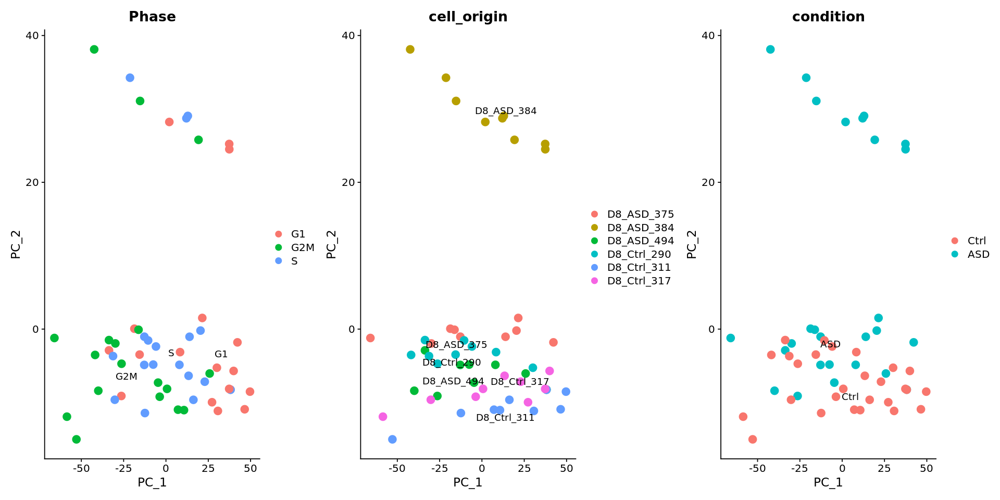

~condition + Phase + Phase:condition + condition:condition.id



[1] "../results/markers_pseudobulk/neighbors_3_314//Wald...condition..Phase..Phase-condition..condition-condition.id/"


Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk/neighbors_3_314//Wald...condition..Phase..Phase-condition..condition-condition.id' already exists”
Starting test

Loading required package: DESeq2

Loading required package: S4Vectors

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sap

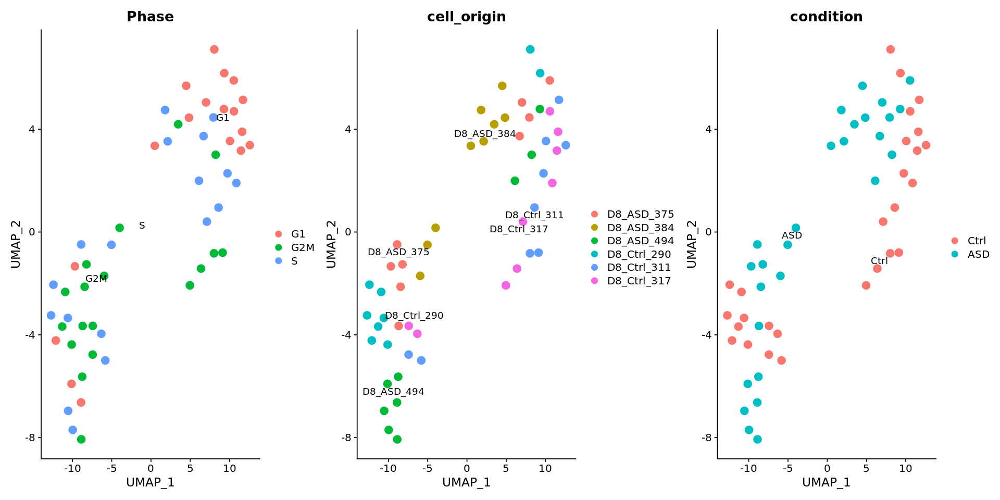

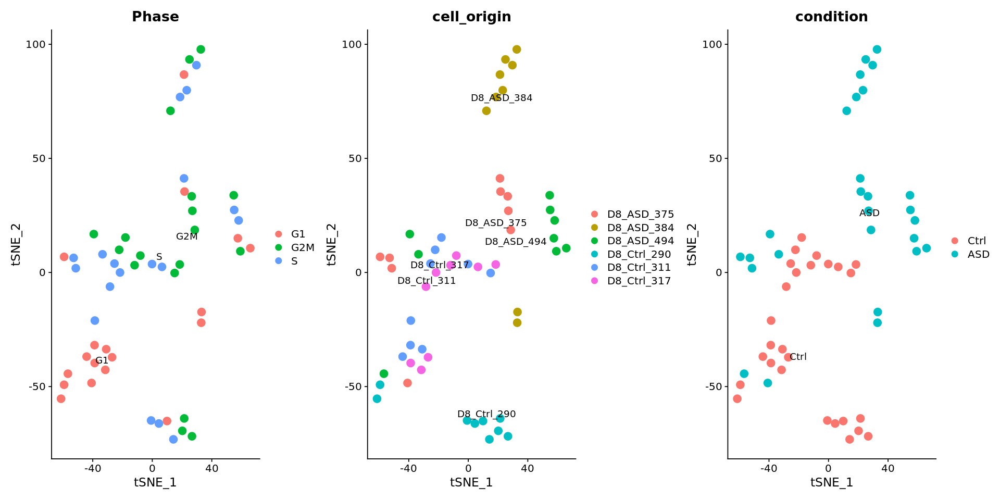

Sample correlation plot



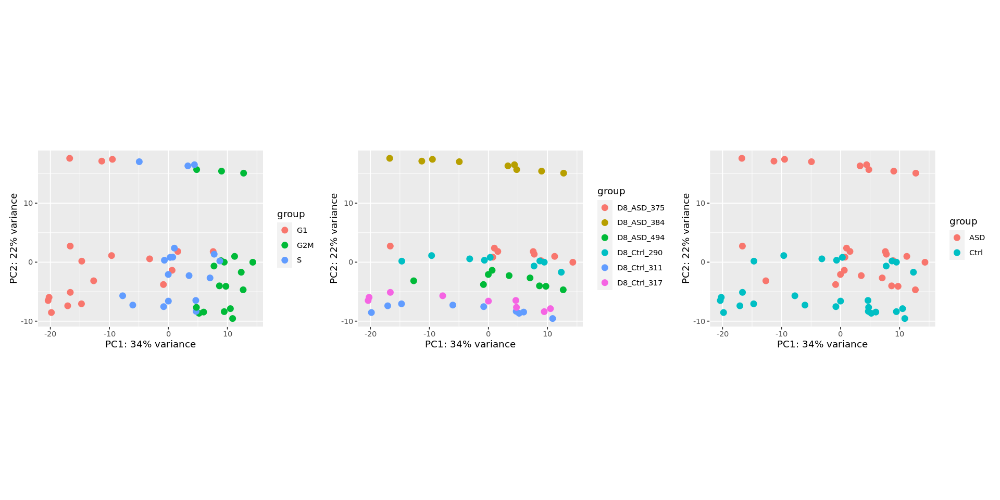

Dispersion estimates plot



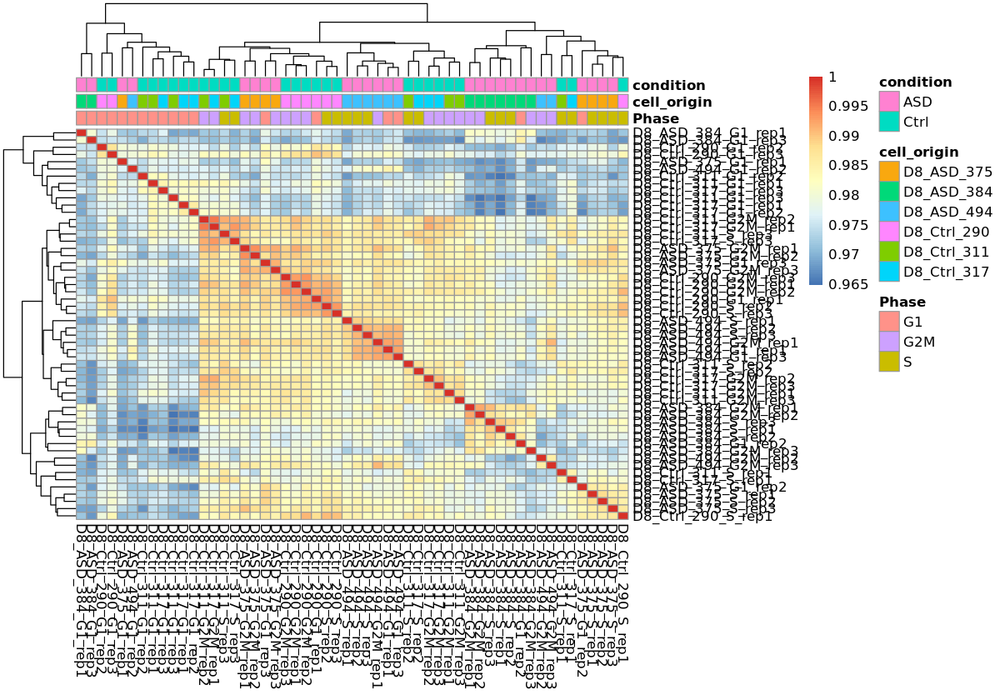

Gathering results

Loading required package: glue


Attaching package: ‘glue’


The following object is masked from ‘package:SummarizedExperiment’:

    trim


The following object is masked from ‘package:GenomicRanges’:

    trim


The following object is masked from ‘package:IRanges’:

    trim




padj_cutoff = 0.05
+ TRUE 1622 & FALSE 13230
log2fc_cutoff = 0.58
+ Over-expressed genes: 583
+ Under-expressed genes: 323


Loading required package: ggplot2

Loading required package: RColorBrewer

Loading required package: reshape2

Loading required package: data.table


Attaching package: ‘data.table’


The following objects are masked from ‘package:reshape2’:

    dcast, melt


The following object is masked from ‘package:SummarizedExperiment’:

    shift


The following object is masked from ‘package:GenomicRanges’:

    shift


The following object is masked from ‘package:IRanges’:

    shift


The following objects are masked from ‘package:S4Vectors’:

    first, second


The following objects are masked from ‘package:dplyr’:

    between, first, last


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 2306 & FALSE 12027
log2fc_cutoff = 0.58
+ Over-expressed genes: 531
+ Under-expressed genes: 413


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 2579 & FALSE 11754
log2fc_cutoff = 0.58
+ Over-expressed genes: 786
+ Under-expressed genes: 409


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 48 & FALSE 10136
log2fc_cutoff = 0.58
+ Over-expressed genes: 0
+ Under-expressed genes: 40


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 2 & FALSE 27296
log2fc_cutoff = 0.58
+ Over-expressed genes: 0
+ Under-expressed genes: 2


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 2021 & FALSE 14905
log2fc_cutoff = 0.58
+ Over-expressed genes: 450
+ Under-expressed genes: 549


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3755 & FALSE 13690
log2fc_cutoff = 0.58
+ Over-expressed genes: 1116
+ Under-expressed genes: 758


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3239 & FALSE 13687
log2fc_cutoff = 0.58
+ Over-expressed genes: 706
+ Under-expressed genes: 749


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3705 & FALSE 12702
log2fc_cutoff = 0.58
+ Over-expressed genes: 750
+ Under-expressed genes: 603


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


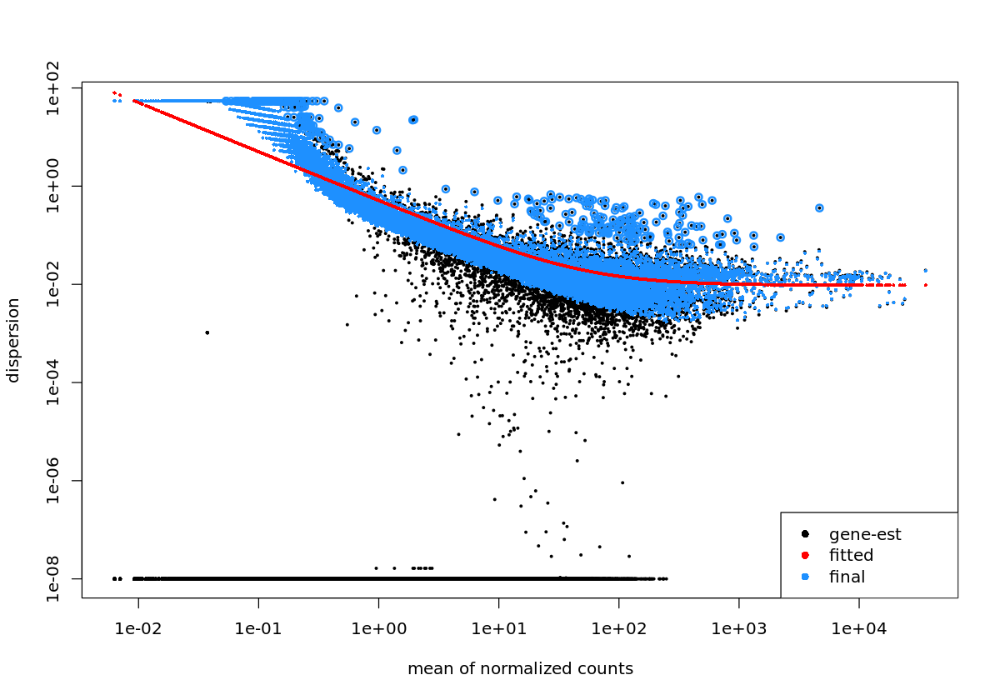

In [11]:
# WALD:
##############################################
# ~1 + condition + Phase + Phase:condition condition:condition.id

res <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = list(c('Phase', 'condition'), c('condition', 'condition.id')),
    # reduced.vars=c('Phase'),
    # interactions =F,
    test = 'Wald',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, 
    sel.method='neighbors',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)



### Export

In [15]:
dds <- res$dea.results$dds

In [18]:
dea_tbl <- get.contrast(dds, compare.var='condition', compare.ref='Ctrl') %>% arrange(desc(abs(log2FoldChange)))
dea_phase_tbl <- get.contrast(dds, compare.var='condition', compare.ref='Ctrl', group.by = 'Phase') %>% arrange(desc(abs(log2FoldChange)))

In [19]:
head(dea_tbl)

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
RPS4Y1,542.93558,7.957848,0.3239452,24.56541,2.960480e-133,1.721519e-129,RPS4Y1
XIST,138.34097,-6.907625,0.4613073,-14.97402,1.085538e-50,6.108777e-48,XIST
EIF1AY,64.50238,6.370338,0.3236847,19.68069,3.156706e-86,6.118749e-83,EIF1AY
DDX3Y,56.41499,5.863859,0.3257271,18.00237,1.866701e-72,2.170973e-69,DDX3Y
USP9Y,52.18477,5.817000,0.3244559,17.92848,7.069055e-72,7.707479e-69,USP9Y
TTTY14,40.00377,5.755727,0.3272607,17.58759,3.066493e-69,2.815524e-66,TTTY14


In [20]:
write.csv(dea_tbl, glue::glue('{save.dir}ASD_vs_Ctrl.csv'), )
write.csv(dea_phase_tbl, glue::glue('{save.dir}ASD_vs_Ctrl_perPhase.csv'), )

### PCA

In [11]:
library(ggplot2)
fig(6,6)

In [12]:
plotPCA.mod <- function(object, pc.a=1, pc.b=2, intgroup = "condition", ntop = 500, returnPCA=FALSE, returnData = FALSE, pt.size=5){
    
    rv <- rowVars(assay(object))
    select <- order(rv, decreasing = TRUE)[seq_len(min(ntop, 
        length(rv)))]
    pca <- prcomp(t(assay(object)[select, ]))
    if (returnPCA){return(pca)}
    percentVar <- pca$sdev^2/sum(pca$sdev^2)
    if (!all(intgroup %in% names(colData(object)))) {
        stop("the argument 'intgroup' should specify columns of colData(dds)")
    }
    intgroup.df <- as.data.frame(colData(object)[, intgroup, 
        drop = FALSE])
    group <- if (length(intgroup) > 1) {
        factor(apply(intgroup.df, 1, paste, collapse = ":"))
    }
    else {
        colData(object)[[intgroup]]
    }
    
    d <- data.frame(PC.A = pca$x[, pc.a], PC.B = pca$x[, pc.b], group = group, 
        intgroup.df, name = colnames(object))
    colnames(d)[1:2] <- paste0('PC', as.character(c(pc.a, pc.b)))
    if (returnData) {
        attr(d, "percentVar") <- percentVar[c(pc.a, pc.b)]
        return(d)
    }
    ggplot(data = d,
           aes_string(x = colnames(d)[1], y = colnames(d)[2], fill = "group")) + 
    geom_point(size = pt.size, shape=21, color='black', stroke=.3) + 
    xlab(paste0(colnames(d)[1], ": ", round(percentVar[pc.a] * 100), "% variance")) +
    ylab(paste0(colnames(d)[2], ": ", round(percentVar[pc.b] * 100), "% variance")) + 
    theme_linedraw() +
    coord_fixed()
}


In [13]:
readRDS('../results/markers_pseudobulk/neighbors_3_314/Wald...condition..Phase..Phase-condition..condition-condition.id/rld.rds') -> rld
rld <- rld[!rownames(rld)%in%sex_chr.genes,]

ntopgenes.use <- 1000
ntopgenes.select <- 50

col.pals <- list('cell_origin'=samples.colors,
                 'condition' = c('ASD'='orangered3', 'Ctrl'='midnightblue'),
                 'Phase'=phases.colors,
                 'origin_sex'=c(Male='forestgreen', Female='yellow'))


pca.folder <- gsub(save.dir, pattern='/results/markers_pseudobulk/', replacement='/plots/pca_pseudobulk/')
dir.create(pca.folder, recursive = T)

Loading required package: DESeq2

Loading required package: S4Vectors

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min



Attaching package: ‘S4Vectors’


The following objects are masked from ‘package:dplyr’:

    first, 

In [14]:
pca.res <- plotPCA.mod(rld, intgroup='cell_origin', returnPCA = T, ntop = ntopgenes.use)
loadings <- pca.res$rotation
percentVar <- data.frame(PC=colnames(loadings), sdev=pca.res$sdev, percentVar=round(pca.res$sdev^2/sum(pca.res$sdev^2)*100,2))
top.neg <- apply(loadings, 2, function(x){rownames(loadings)[order(x)<=ntopgenes.select]})
top.pos <- apply(loadings, 2, function(x){rownames(loadings)[order(x, decreasing=T)<=ntopgenes.select]})

saveRDS(pca.res,  file = glue::glue('{pca.folder}PCA_results.{ntopgenes.use}_genes_used.rds'))
openxlsx::write.xlsx(file = glue::glue('{pca.folder}PCA_results.{ntopgenes.use}_genes_used.xlsx'),
                     x= list(Loadings=loadings, ExplainedVar=percentVar, `Top positive genes`=top.pos, `Top negative genes`=top.neg))

In [15]:
n.pcs <- 10

minmax <- function(x){(x-min(x))/(max(x)/min(x))}

pdf(glue::glue('{pca.folder}PCA_results.{ntopgenes.use}_genes_used.pdf'), width=20, height=5*(n.pcs-1))
for (pc.a in 1:n.pcs){
    a.plots <- list()
    for (pc.b in 1:n.pcs){
        if (pc.a==pc.b){next()}
                
        lapply(names(col.pals), function(l){
            
            plotPCA.mod(rld, pc.a=pc.a, pc.b=pc.b, intgroup=l, returnData=F, ntop = ntopgenes.use) +
            scale_fill_manual(values=col.pals[[l]]) + 
            labs(fill=l) +
            ggtitle(glue::glue('PC{pc.a} vs PC{pc.b}')) + 
            theme(legend.position='bottom') -> p
            p$data[,1:2] <- apply(p$data[,1:2], 2, minmax)
            p
        }) %>% cowplot::plot_grid(plotlist = ., nrow = 1, align='h', axis='tb', rel_widths=c(1,1,1,1)) -> p
        
        a.plots[[as.character(pc.b)]] <- p
        
    }
    
    cowplot::plot_grid(plotlist = a.plots, ncol = 1, align='v', axis='lr', rel_heights=rep(1, n = (n.pcs-1))) -> p
    print(p)
}
dev.off()

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.”


ERROR: Error in FUN(X[[i]], ...): object 'minmax' not found


In [ ]:
pc.anno <- cbind(pca.res$x[,1:n.pcs], colData(rld)[,names(col.pals)]) %>% as.data.frame()

for (color.var in names(col.pals)){

    color.scale <- col.pals[[color.var]]
    pc.anno$color <- pc.anno[,color.var]

    p <- ggpairs(pc.anno, columns=1:(ncol(pc.anno)-1), 
                 mapping = aes(color = color, fill = color, alpha='p')) + 
        theme_bw() + 
        scale_alpha_manual(values=.7) + 
        scale_fill_manual(values=color.scale) +
        scale_color_manual(values=color.scale)

    pdf(glue::glue('{pca.folder}PCA_overview.{ntopgenes.use}_genes_used.top_{n.pcs}.color_{color.var}.pdf'), height = 20, width=20)
    suppressMessages({print(p)})
    dev.off()
    
}

# Other tests

## 3 samples & fixed cells

#### ~condition + Phase

In [ ]:
n_samples <- 3
n_cells <- floor(min(table(seu.rge@meta.data[,c('Phase', 'cell_origin')]))/n_samples)

save.dir <- paste0(results.dir, glue::glue('{n_samples}_{n_cells}/'))
dir.create(save.dir)
save.dir

Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 5/54 (9.26%)

+ 11/54 (20.37%)

+ 16/54 (29.63%)

+ 22/54 (40.74%)

+ 27/54 (50%)

+ 32/54 (59.26%)

+ 38/54 (70.37%)

+ 43/54 (79.63%)

+ 49/54 (90.74%)

+ 54/54 (100%)

Merging 54 objects

Restoring factors

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


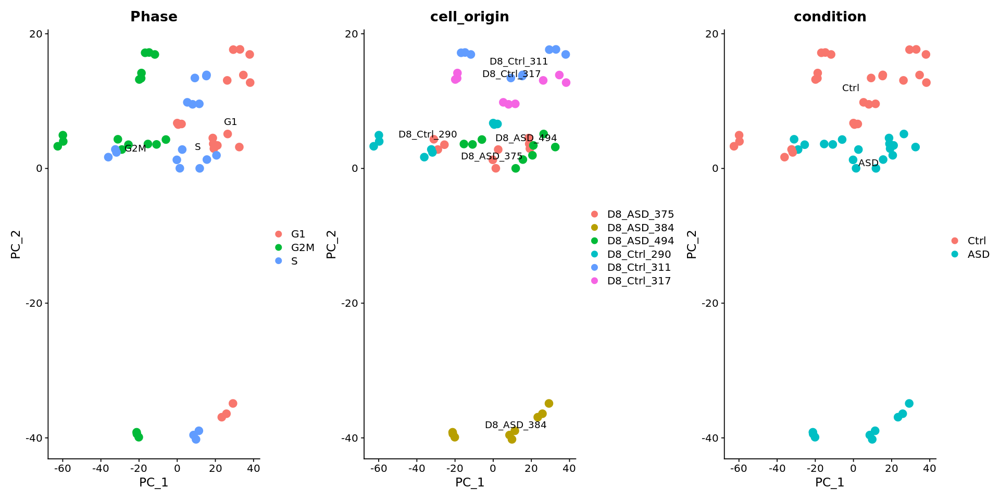

~condition + Phase



[1] "../results/markers_pseudobulk/3_314//Wald...condition..Phase/"


Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk/3_314//Wald...condition..Phase' already exists”
Starting test

Loading required package: DESeq2

Loading required package: S4Vectors

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min



Attaching package: ‘S4Vectors’


The foll

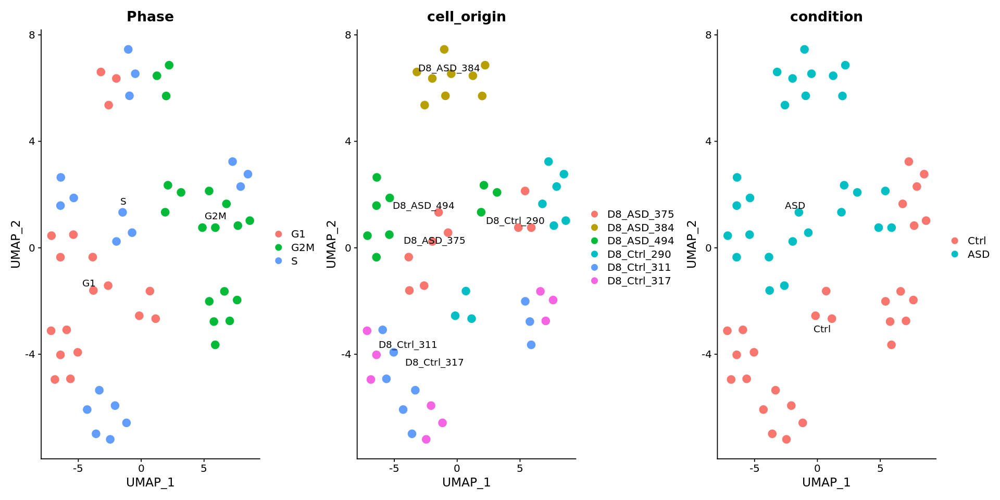

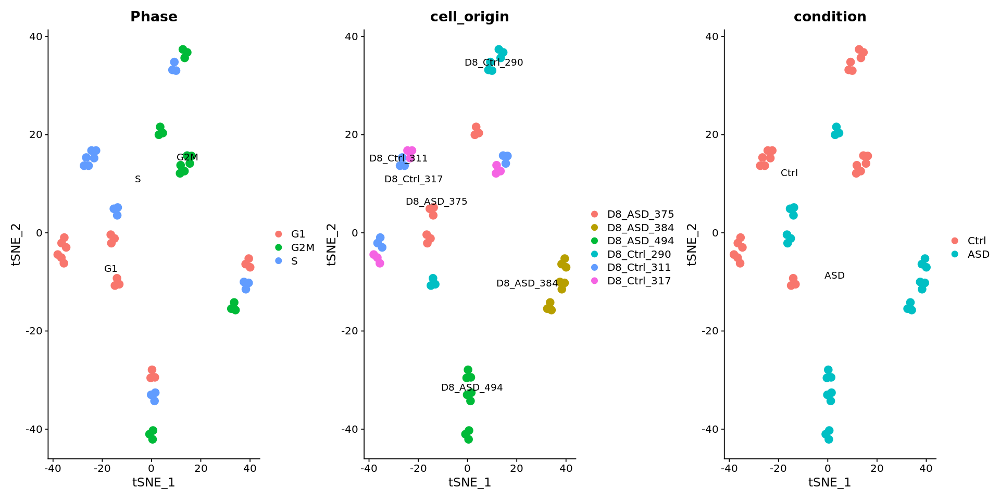

Sample correlation plot



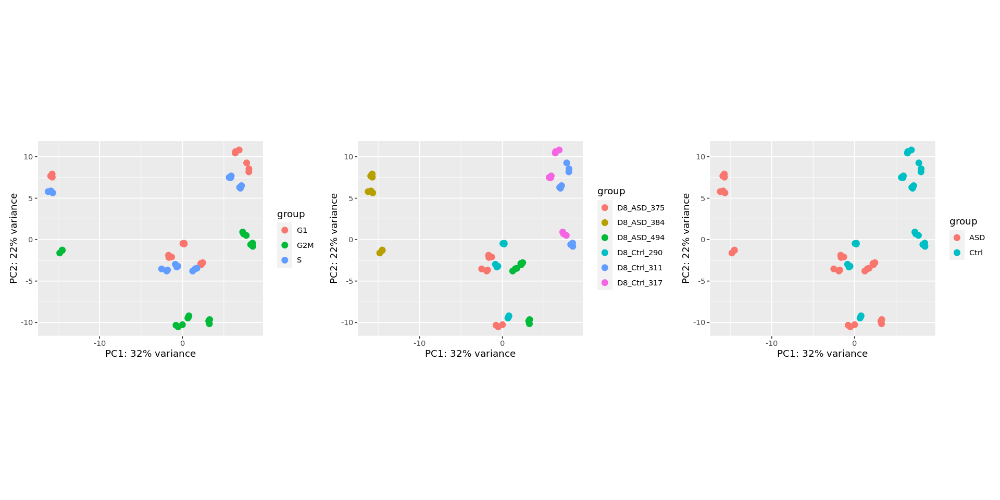

Dispersion estimates plot



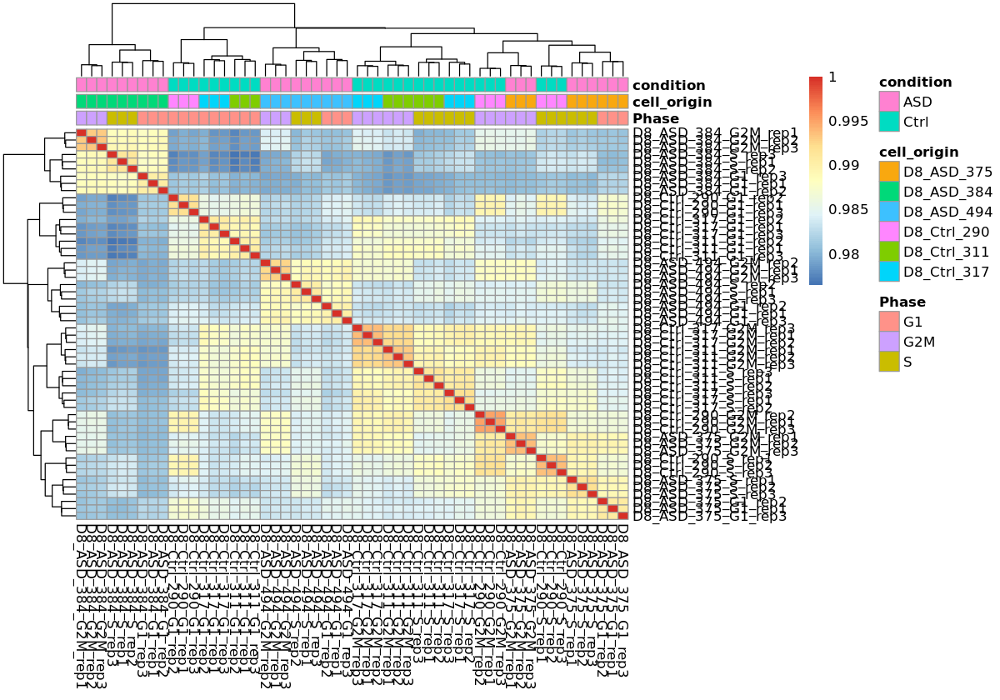

Gathering results

Loading required package: glue


Attaching package: ‘glue’


The following object is masked from ‘package:SummarizedExperiment’:

    trim


The following object is masked from ‘package:GenomicRanges’:

    trim


The following object is masked from ‘package:IRanges’:

    trim




padj_cutoff = 0.05
+ TRUE 4884 & FALSE 13052
log2fc_cutoff = 0.58
+ Over-expressed genes: 861
+ Under-expressed genes: 225


Loading required package: ggplot2

Loading required package: RColorBrewer

Loading required package: reshape2

Loading required package: data.table


Attaching package: ‘data.table’


The following objects are masked from ‘package:reshape2’:

    dcast, melt


The following object is masked from ‘package:SummarizedExperiment’:

    shift


The following object is masked from ‘package:GenomicRanges’:

    shift


The following object is masked from ‘package:IRanges’:

    shift


The following objects are masked from ‘package:S4Vectors’:

    first, second


The following objects are masked from ‘package:dplyr’:

    between, first, last


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 2342 & FALSE 13523
log2fc_cutoff = 0.58
+ Over-expressed genes: 348
+ Under-expressed genes: 226


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3170 & FALSE 12178
log2fc_cutoff = 0.58
+ Over-expressed genes: 517
+ Under-expressed genes: 247


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 5/54 (9.26%)

+ 11/54 (20.37%)

+ 16/54 (29.63%)

+ 22/54 (40.74%)

+ 27/54 (50%)

+ 32/54 (59.26%)

+ 38/54 (70.37%)

+ 43/54 (79.63%)

+ 49/54 (90.74%)

+ 54/54 (100%)

Merging 54 objects

Restoring factors

~condition + Phase

~Phase



[1] "../results/markers_pseudobulk/3_314//LRT...condition..Phase...Phase/"


Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk/3_314//LRT...condition..Phase...Phase' already exists”
Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA

Sample correlation plot

Dispersion estimates plot

Gathering results



padj_cutoff = 0.05
+ TRUE 4982 & FALSE 12944
log2fc_cutoff = 0.58
+ Over-expressed genes: 883
+ Under-expressed genes: 228


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 4982 & FALSE 12944
log2fc_cutoff = 0.58
+ Over-expressed genes: 147
+ Under-expressed genes: 147


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 4982 & FALSE 12944
log2fc_cutoff = 0.58
+ Over-expressed genes: 241
+ Under-expressed genes: 116


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


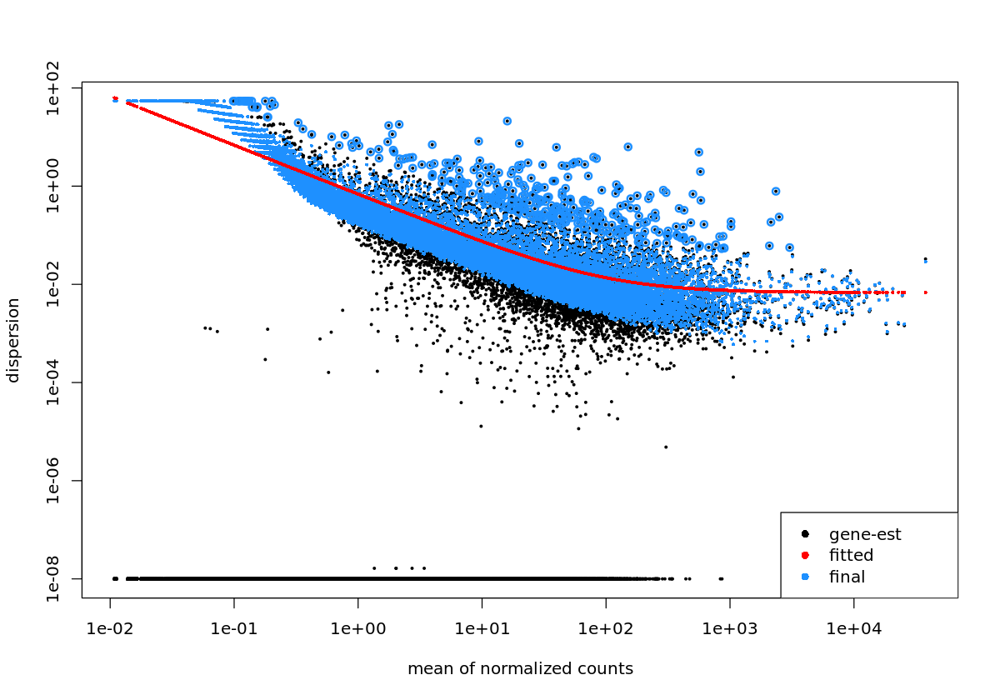

In [10]:
# WALD:
##############################################
res <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    # reduced.vars=c('Phase'),
    interactions =F,
    test = 'Wald',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)


# LTR:
##############################################
# -Phase
res.lrt <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = F,
    reduced.vars=c('Phase'), # maybe add condition.id, condition:condition.id cannot be removed
    test = 'LRT',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)

#### ~condition + Phase + condition:phase

Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 5/54 (9.26%)

+ 11/54 (20.37%)

+ 16/54 (29.63%)

+ 22/54 (40.74%)

+ 27/54 (50%)

+ 32/54 (59.26%)

+ 38/54 (70.37%)

+ 43/54 (79.63%)

+ 49/54 (90.74%)

+ 54/54 (100%)

Merging 54 objects

Restoring factors



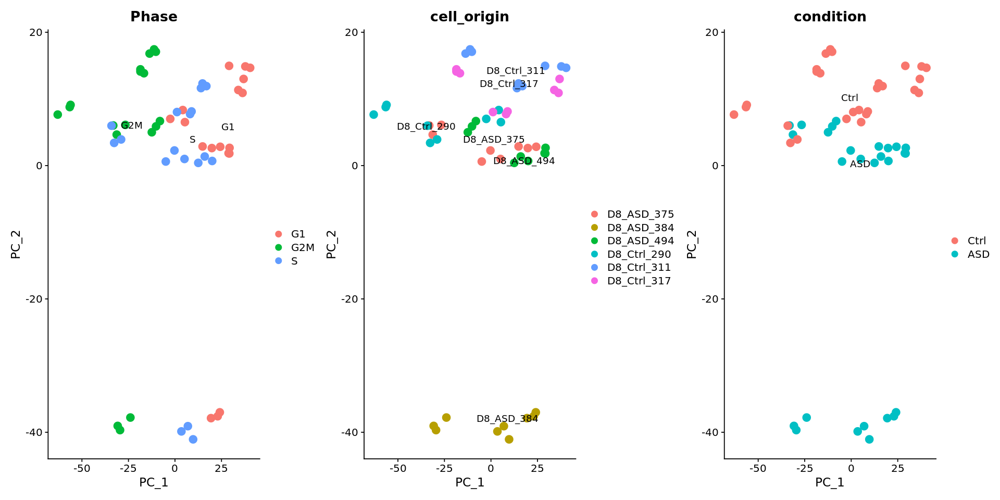

~condition + Phase + condition:Phase



[1] "../results/markers_pseudobulk/3_314//Wald...condition..Phase..condition-Phase/"


Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk/3_314//Wald...condition..Phase..condition-Phase' already exists”
Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA



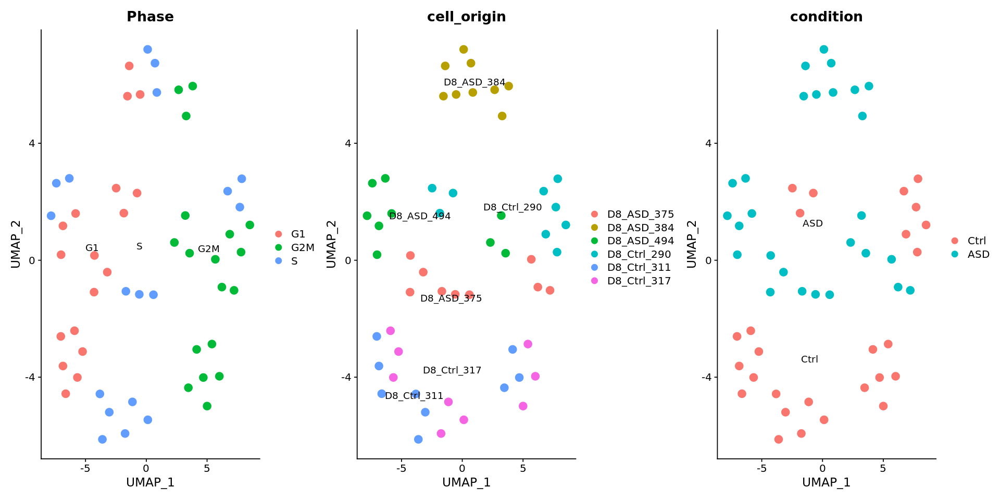

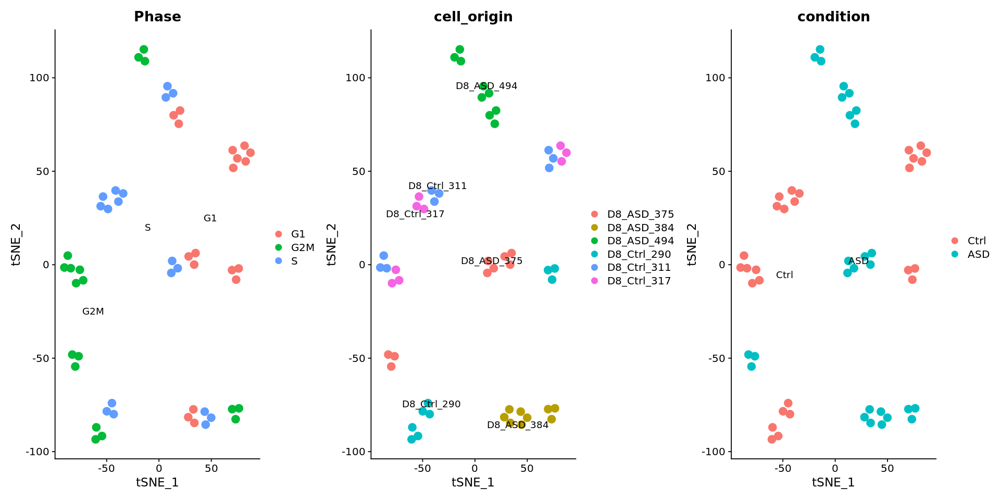

Sample correlation plot



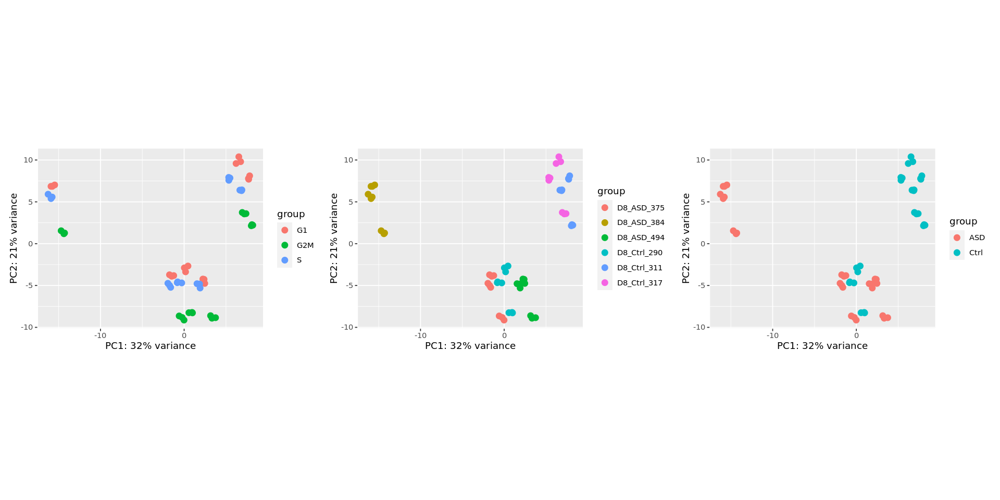

Dispersion estimates plot



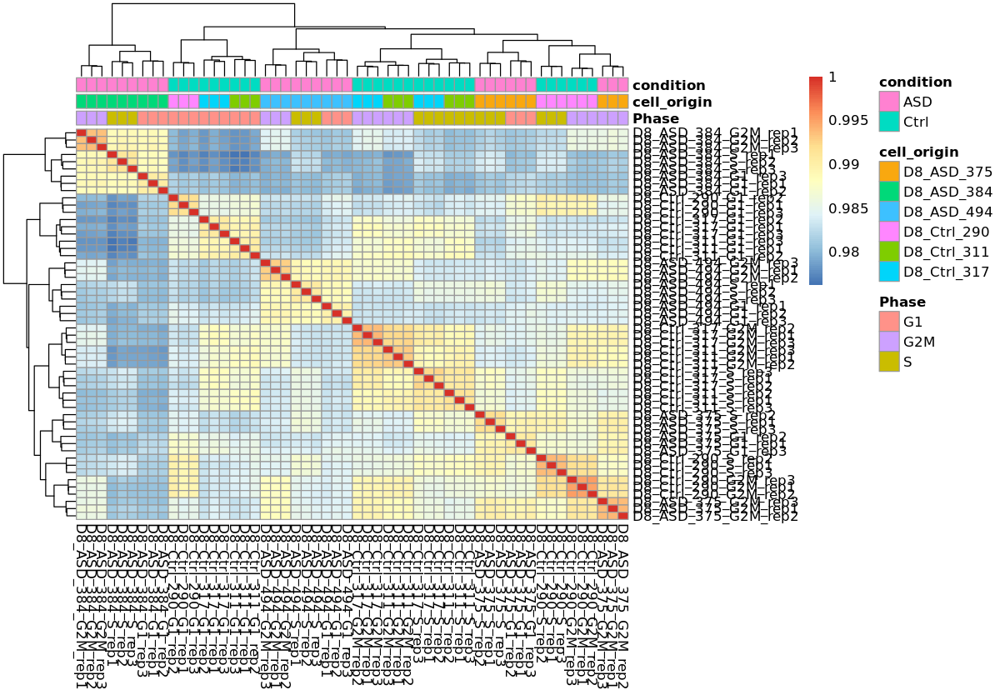

Gathering results



padj_cutoff = 0.05
+ TRUE 1650 & FALSE 11622
log2fc_cutoff = 0.58
+ Over-expressed genes: 384
+ Under-expressed genes: 111


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 1426 & FALSE 12363
log2fc_cutoff = 0.58
+ Over-expressed genes: 391
+ Under-expressed genes: 151


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 1851 & FALSE 11938
log2fc_cutoff = 0.58
+ Over-expressed genes: 511
+ Under-expressed genes: 168


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 49 & FALSE 8048
log2fc_cutoff = 0.58
+ Over-expressed genes: 0
+ Under-expressed genes: 29
padj_cutoff = 0.05
+ TRUE 35 & FALSE 10649
log2fc_cutoff = 0.58
+ Over-expressed genes: 0
+ Under-expressed genes: 25


Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 5/54 (9.26%)

+ 11/54 (20.37%)

+ 16/54 (29.63%)

+ 22/54 (40.74%)

+ 27/54 (50%)

+ 32/54 (59.26%)

+ 38/54 (70.37%)

+ 43/54 (79.63%)

+ 49/54 (90.74%)

+ 54/54 (100%)

Merging 54 objects

Restoring factors

~condition + Phase + condition:Phase

~Phase



[1] "../results/markers_pseudobulk/3_314//LRT...condition..Phase..condition-Phase...Phase/"


Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk/3_314//LRT...condition..Phase..condition-Phase...Phase' already exists”
Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA

Sample correlation plot

Dispersion estimates plot

Gathering results



padj_cutoff = 0.05
+ TRUE 3298 & FALSE 13572
log2fc_cutoff = 0.58
+ Over-expressed genes: 651
+ Under-expressed genes: 190


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3298 & FALSE 13572
log2fc_cutoff = 0.58
+ Over-expressed genes: 216
+ Under-expressed genes: 139


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3298 & FALSE 13572
log2fc_cutoff = 0.58
+ Over-expressed genes: 297
+ Under-expressed genes: 108


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3298 & FALSE 13572
log2fc_cutoff = 0.58
+ Over-expressed genes: 106
+ Under-expressed genes: 149


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3298 & FALSE 13572
log2fc_cutoff = 0.58
+ Over-expressed genes: 89
+ Under-expressed genes: 156


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


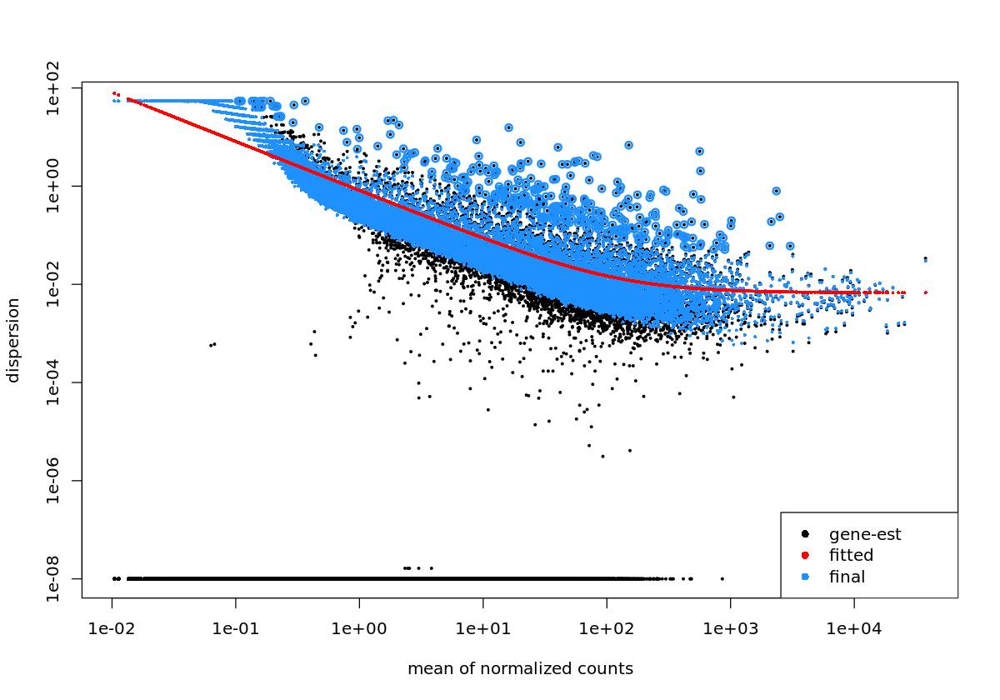

In [11]:
# WALD:
##############################################
res <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    # reduced.vars=c('Phase'),
    interactions =T,
    test = 'Wald',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)


# LTR:
##############################################
# -Phase
res.lrt <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = T,
    reduced.vars=c('Phase'), # maybe add condition.id, condition:condition.id cannot be removed
    test = 'LRT',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)

#### ~condition + Phase + condition:condition.id

Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 5/54 (9.26%)

+ 11/54 (20.37%)

+ 16/54 (29.63%)

+ 22/54 (40.74%)

+ 27/54 (50%)

+ 32/54 (59.26%)

+ 38/54 (70.37%)

+ 43/54 (79.63%)

+ 49/54 (90.74%)

+ 54/54 (100%)

Merging 54 objects

Restoring factors



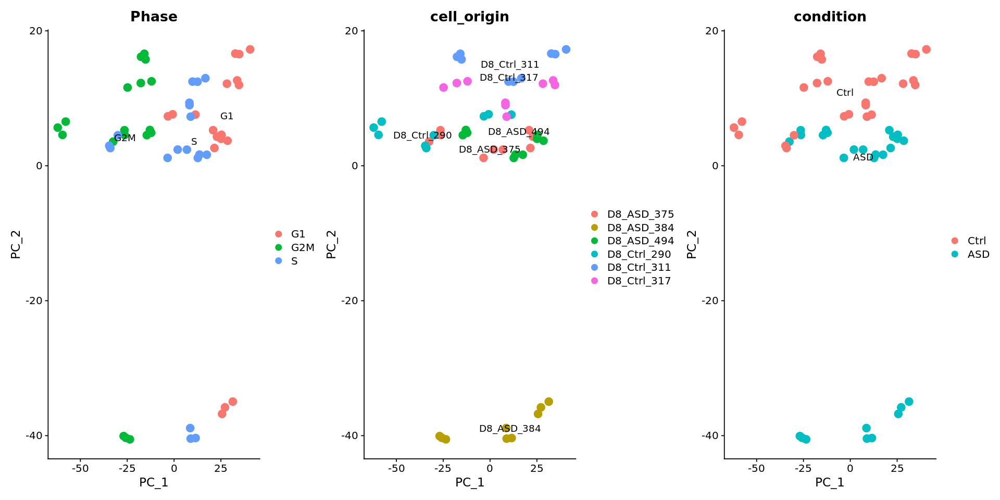

~condition + Phase + condition:condition.id



[1] "../results/markers_pseudobulk/3_314//Wald...condition..Phase..condition-condition.id/"


Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk/3_314//Wald...condition..Phase..condition-condition.id' already exists”
Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA



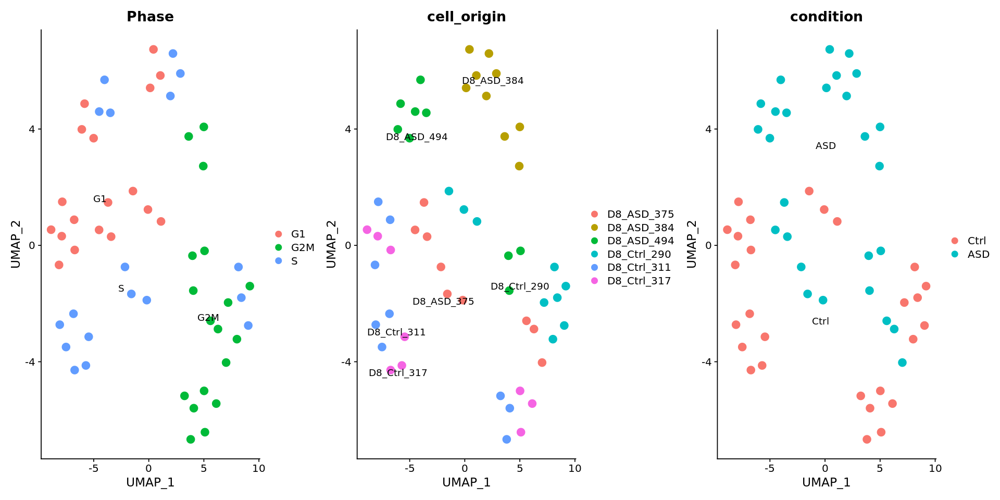

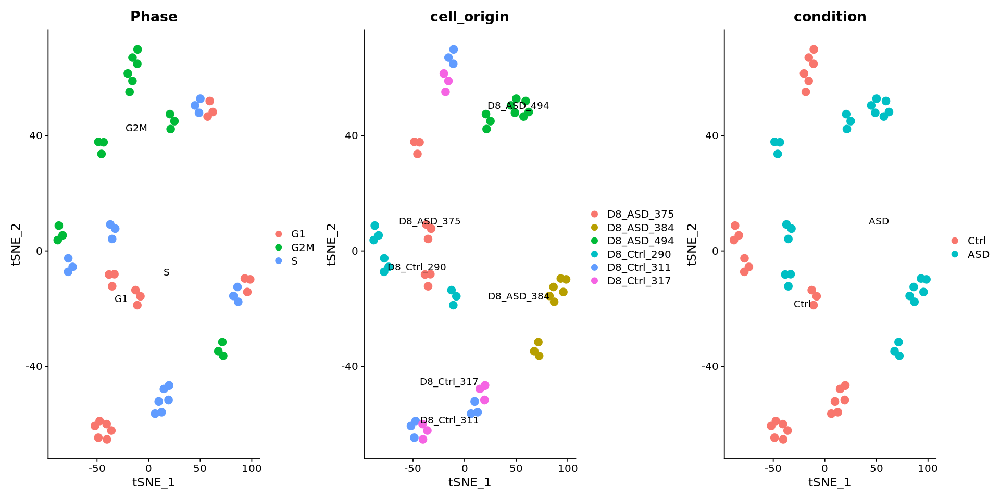

Sample correlation plot



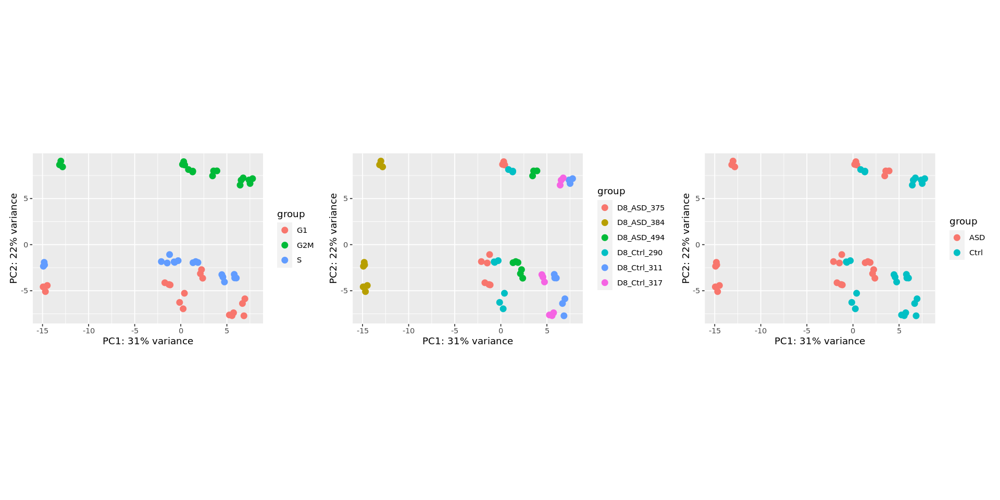

Dispersion estimates plot



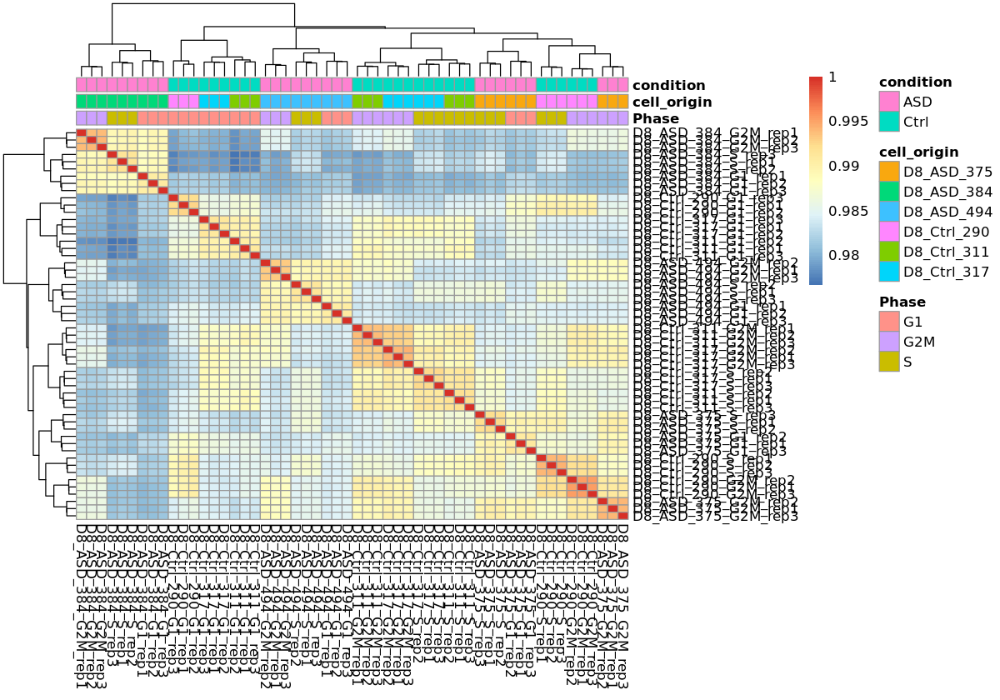

Gathering results



padj_cutoff = 0.05
+ TRUE 3722 & FALSE 13198
log2fc_cutoff = 0.58
+ Over-expressed genes: 613
+ Under-expressed genes: 490


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3422 & FALSE 11943
log2fc_cutoff = 0.58
+ Over-expressed genes: 370
+ Under-expressed genes: 278


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 4256 & FALSE 11109
log2fc_cutoff = 0.58
+ Over-expressed genes: 552
+ Under-expressed genes: 287


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3360 & FALSE 13560
log2fc_cutoff = 0.58
+ Over-expressed genes: 510
+ Under-expressed genes: 601


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 5196 & FALSE 12243
log2fc_cutoff = 0.58
+ Over-expressed genes: 1190
+ Under-expressed genes: 809


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 4418 & FALSE 12502
log2fc_cutoff = 0.58
+ Over-expressed genes: 704
+ Under-expressed genes: 773


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 4943 & FALSE 11977
log2fc_cutoff = 0.58
+ Over-expressed genes: 851
+ Under-expressed genes: 600


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 5/54 (9.26%)

+ 11/54 (20.37%)

+ 16/54 (29.63%)

+ 22/54 (40.74%)

+ 27/54 (50%)

+ 32/54 (59.26%)

+ 38/54 (70.37%)

+ 43/54 (79.63%)

+ 49/54 (90.74%)

+ 54/54 (100%)

Merging 54 objects

Restoring factors

~condition + Phase + condition:condition.id

~Phase



[1] "../results/markers_pseudobulk/3_314//LRT...condition..Phase..condition-condition.id...Phase/"


Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk/3_314//LRT...condition..Phase..condition-condition.id...Phase' already exists”
Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA

Sample correlation plot

Dispersion estimates plot

Gathering results



padj_cutoff = 0.05
+ TRUE 9776 & FALSE 8679
log2fc_cutoff = 0.58
+ Over-expressed genes: 929
+ Under-expressed genes: 724


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9776 & FALSE 8679
log2fc_cutoff = 0.58
+ Over-expressed genes: 290
+ Under-expressed genes: 327


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9776 & FALSE 8679
log2fc_cutoff = 0.58
+ Over-expressed genes: 473
+ Under-expressed genes: 218


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9776 & FALSE 8679
log2fc_cutoff = 0.58
+ Over-expressed genes: 766
+ Under-expressed genes: 929


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9776 & FALSE 8679
log2fc_cutoff = 0.58
+ Over-expressed genes: 1444
+ Under-expressed genes: 944


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9776 & FALSE 8679
log2fc_cutoff = 0.58
+ Over-expressed genes: 899
+ Under-expressed genes: 1059


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9776 & FALSE 8679
log2fc_cutoff = 0.58
+ Over-expressed genes: 1121
+ Under-expressed genes: 797


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


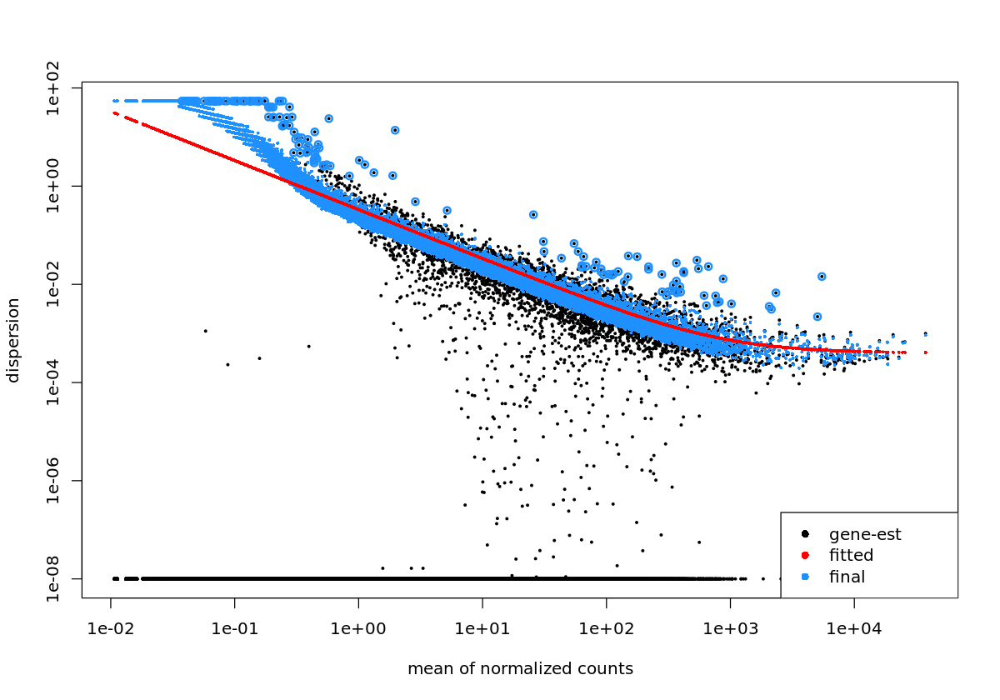

In [12]:
# WALD:
##############################################
res <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = list(c('condition', 'condition.id')),
    # reduced.vars=c('Phase'),
    # interactions =F,
    test = 'Wald',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)

# LTR:
##############################################
# -Phase
res.lrt <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = list(c('condition', 'condition.id')),
    reduced.vars=c('Phase'), # maybe add condition.id, condition:condition.id cannot be removed
    test = 'LRT',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)

## 2 samples & fixed cells

In [13]:
n_samples <- 2
n_cells <- floor(min(table(seu.rge@meta.data[,c('Phase', 'cell_origin')]))/n_samples)

save.dir <- paste0(results.dir, glue::glue('{n_samples}_{n_cells}/'))
dir.create(save.dir)
save.dir

Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk/2_472' already exists”


[1] "../results/markers_pseudobulk/2_472/"

#### ~condition + Phase

Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 4/36 (11.11%)

+ 7/36 (19.44%)

+ 11/36 (30.56%)

+ 14/36 (38.89%)

+ 18/36 (50%)

+ 22/36 (61.11%)

+ 25/36 (69.44%)

+ 29/36 (80.56%)

+ 32/36 (88.89%)

+ 36/36 (100%)

Merging 36 objects

Restoring factors



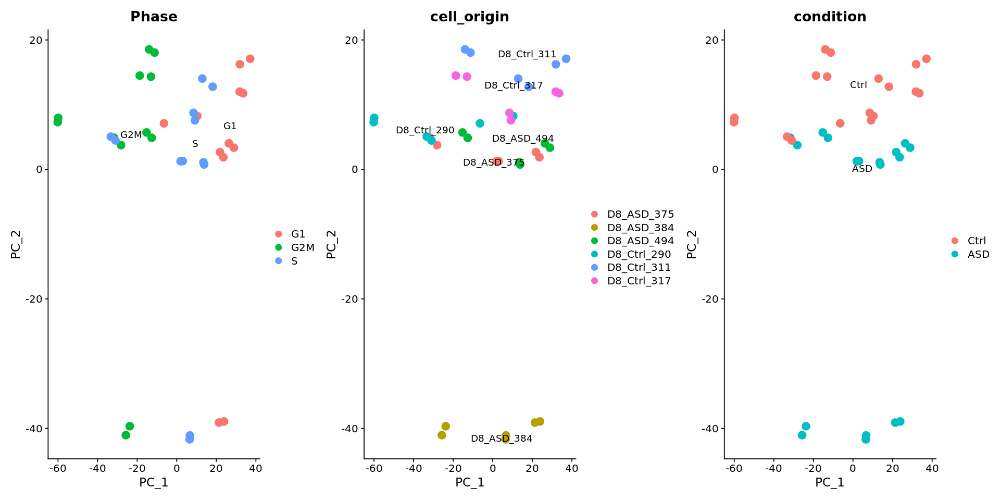

~condition + Phase



[1] "../results/markers_pseudobulk/2_472//Wald...condition..Phase/"


Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk/2_472//Wald...condition..Phase' already exists”
Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA



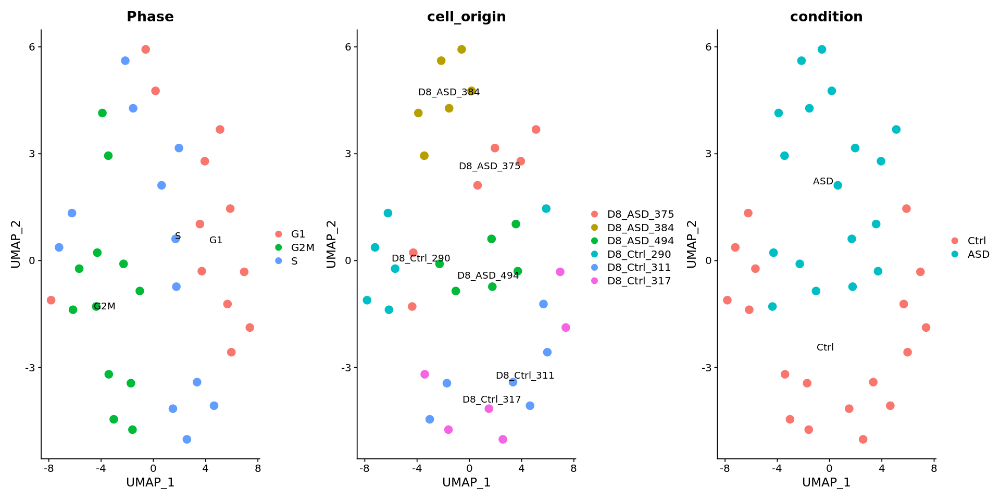

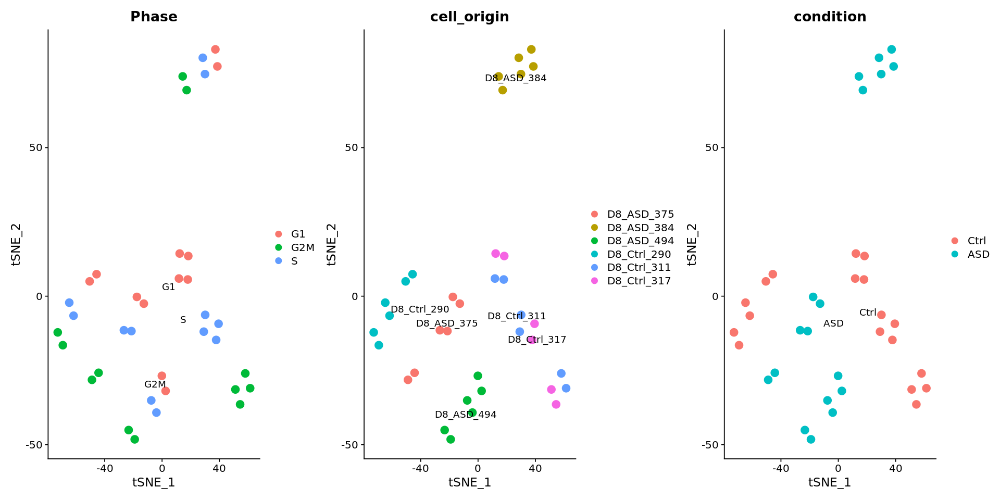

Sample correlation plot



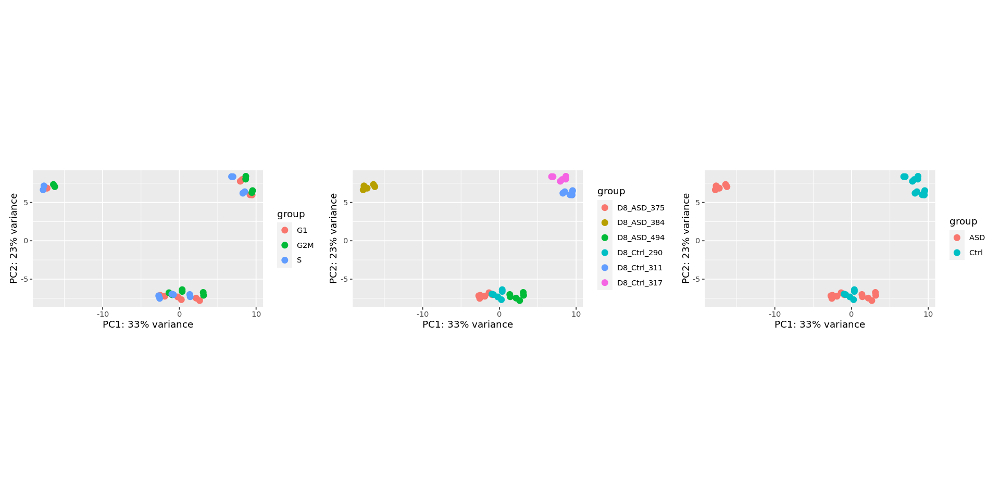

Dispersion estimates plot



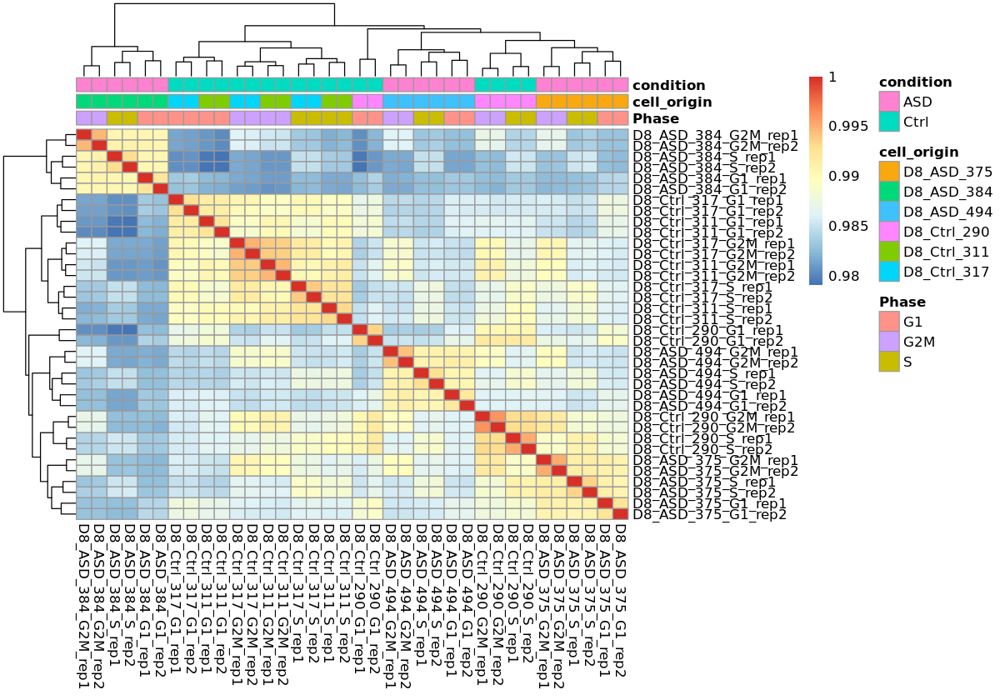

Gathering results



padj_cutoff = 0.05
+ TRUE 4181 & FALSE 12729
log2fc_cutoff = 0.58
+ Over-expressed genes: 726
+ Under-expressed genes: 206


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 1941 & FALSE 12379
log2fc_cutoff = 0.58
+ Over-expressed genes: 336
+ Under-expressed genes: 154


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 2606 & FALSE 12750
log2fc_cutoff = 0.58
+ Over-expressed genes: 499
+ Under-expressed genes: 221


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 4/36 (11.11%)

+ 7/36 (19.44%)

+ 11/36 (30.56%)

+ 14/36 (38.89%)

+ 18/36 (50%)

+ 22/36 (61.11%)

+ 25/36 (69.44%)

+ 29/36 (80.56%)

+ 32/36 (88.89%)

+ 36/36 (100%)

Merging 36 objects

Restoring factors

~condition + Phase

~Phase



[1] "../results/markers_pseudobulk/2_472//LRT...condition..Phase...Phase/"


Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk/2_472//LRT...condition..Phase...Phase' already exists”
Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA

Sample correlation plot

Dispersion estimates plot

Gathering results



padj_cutoff = 0.05
+ TRUE 4265 & FALSE 13687
log2fc_cutoff = 0.58
+ Over-expressed genes: 763
+ Under-expressed genes: 209


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 4265 & FALSE 13687
log2fc_cutoff = 0.58
+ Over-expressed genes: 149
+ Under-expressed genes: 110


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 4265 & FALSE 13687
log2fc_cutoff = 0.58
+ Over-expressed genes: 236
+ Under-expressed genes: 104


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


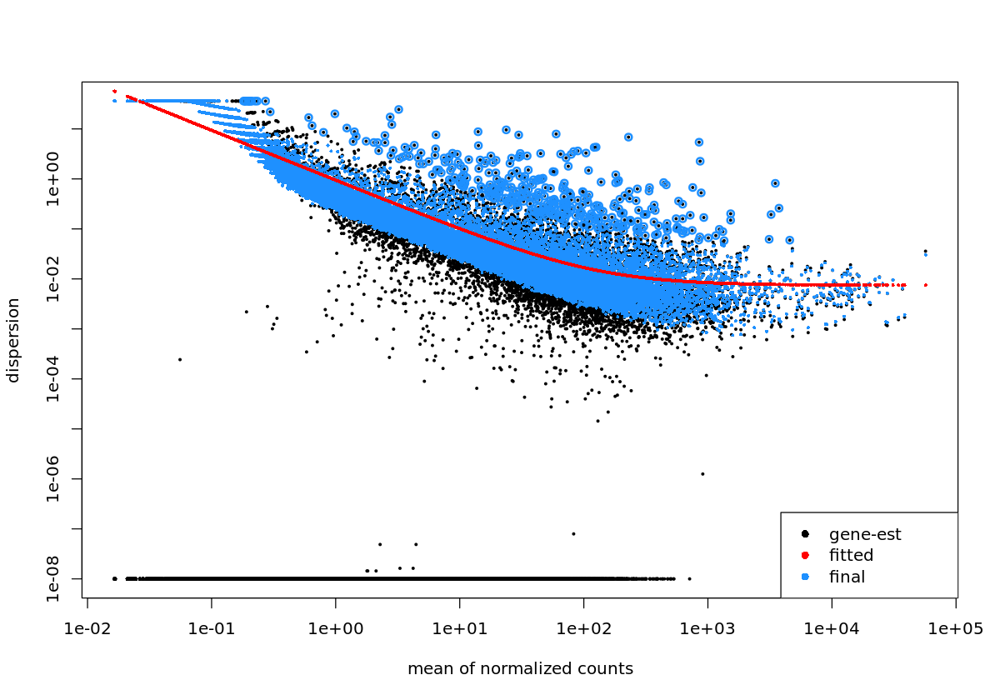

In [14]:
# WALD:
##############################################
res <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    # reduced.vars=c('Phase'),
    interactions =F,
    test = 'Wald',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)


# LTR:
##############################################
# -Phase
res.lrt <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = F,
    reduced.vars=c('Phase'), # maybe add condition.id, condition:condition.id cannot be removed
    test = 'LRT',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)

#### ~condition + Phase + condition:phase

Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 4/36 (11.11%)

+ 7/36 (19.44%)

+ 11/36 (30.56%)

+ 14/36 (38.89%)

+ 18/36 (50%)

+ 22/36 (61.11%)

+ 25/36 (69.44%)

+ 29/36 (80.56%)

+ 32/36 (88.89%)

+ 36/36 (100%)

Merging 36 objects

Restoring factors



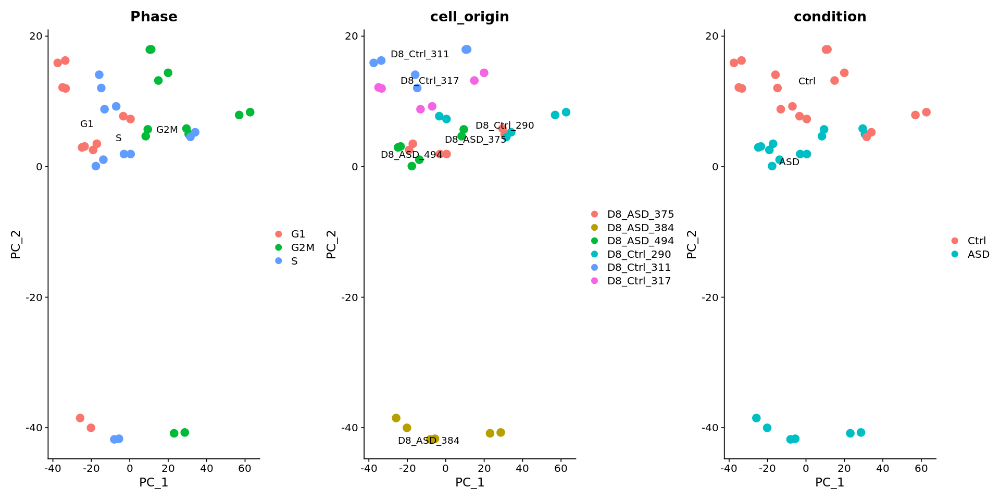

~condition + Phase + condition:Phase



[1] "../results/markers_pseudobulk/2_472//Wald...condition..Phase..condition-Phase/"


Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk/2_472//Wald...condition..Phase..condition-Phase' already exists”
Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA



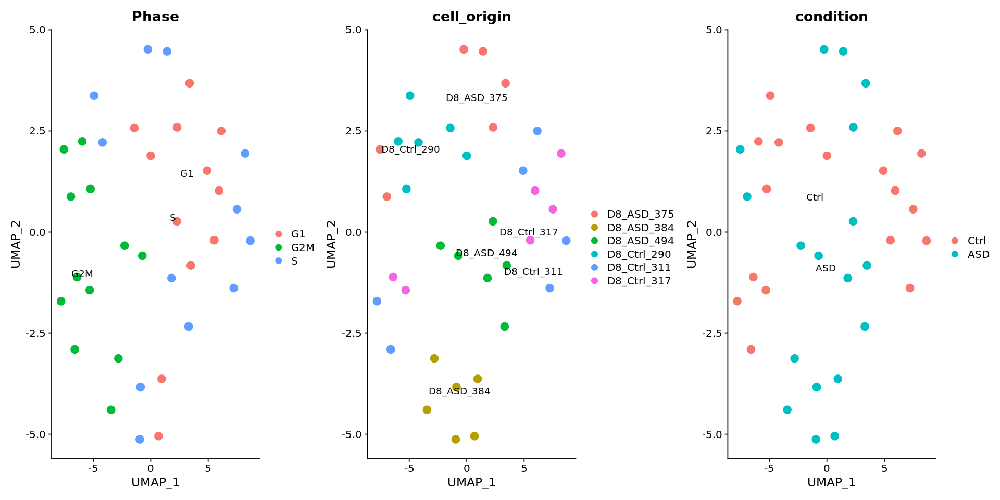

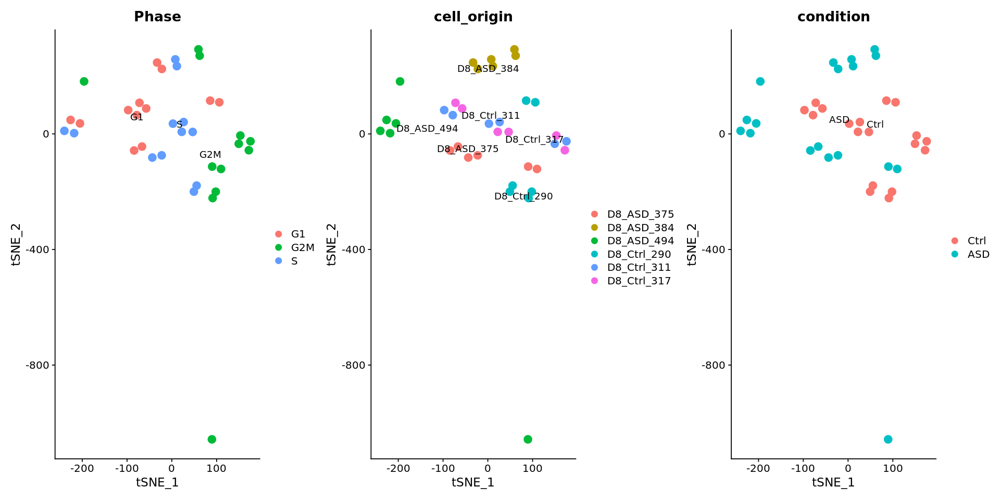

Sample correlation plot



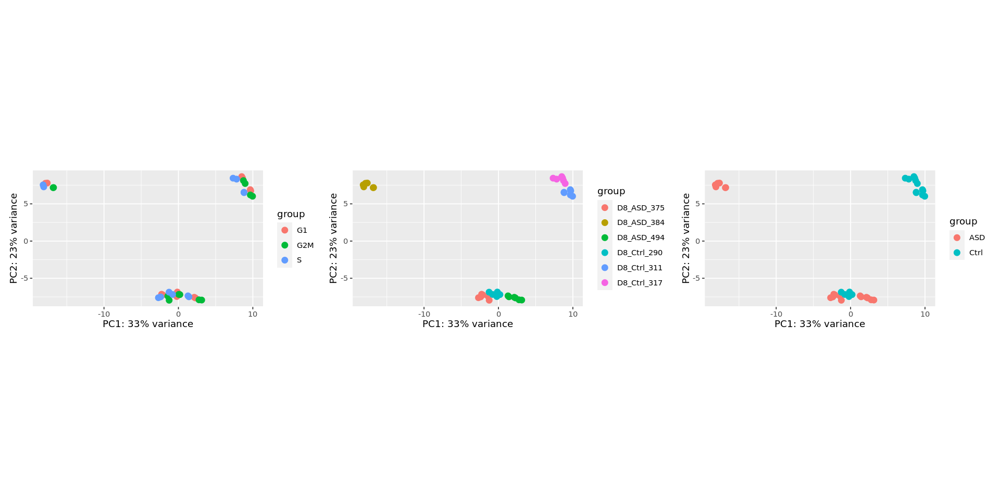

Dispersion estimates plot



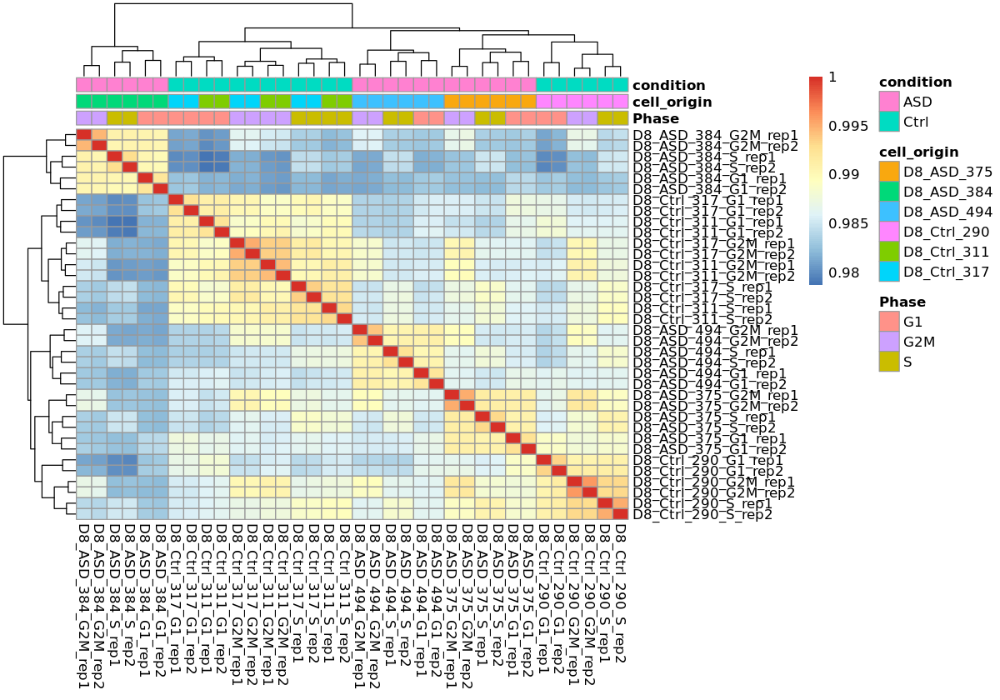

Gathering results



padj_cutoff = 0.05
+ TRUE 986 & FALSE 11264
log2fc_cutoff = 0.58
+ Over-expressed genes: 231
+ Under-expressed genes: 71


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 984 & FALSE 12303
log2fc_cutoff = 0.58
+ Over-expressed genes: 348
+ Under-expressed genes: 107


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 1318 & FALSE 13005
log2fc_cutoff = 0.58
+ Over-expressed genes: 456
+ Under-expressed genes: 125


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 2 & FALSE 27275
log2fc_cutoff = 0.58
+ Over-expressed genes: 0
+ Under-expressed genes: 2
padj_cutoff = 0.05
+ TRUE 9 & FALSE 27268
log2fc_cutoff = 0.58
+ Over-expressed genes: 0
+ Under-expressed genes: 8


Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 4/36 (11.11%)

+ 7/36 (19.44%)

+ 11/36 (30.56%)

+ 14/36 (38.89%)

+ 18/36 (50%)

+ 22/36 (61.11%)

+ 25/36 (69.44%)

+ 29/36 (80.56%)

+ 32/36 (88.89%)

+ 36/36 (100%)

Merging 36 objects

Restoring factors

~condition + Phase + condition:Phase

~Phase



[1] "../results/markers_pseudobulk/2_472//LRT...condition..Phase..condition-Phase...Phase/"


Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk/2_472//LRT...condition..Phase..condition-Phase...Phase' already exists”
Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA

Sample correlation plot

Dispersion estimates plot

Gathering results



padj_cutoff = 0.05
+ TRUE 2538 & FALSE 14370
log2fc_cutoff = 0.58
+ Over-expressed genes: 563
+ Under-expressed genes: 140


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 2538 & FALSE 14370
log2fc_cutoff = 0.58
+ Over-expressed genes: 183
+ Under-expressed genes: 96


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 2538 & FALSE 14370
log2fc_cutoff = 0.58
+ Over-expressed genes: 285
+ Under-expressed genes: 74


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 2538 & FALSE 14370
log2fc_cutoff = 0.58
+ Over-expressed genes: 69
+ Under-expressed genes: 130


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 2538 & FALSE 14370
log2fc_cutoff = 0.58
+ Over-expressed genes: 66
+ Under-expressed genes: 164


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


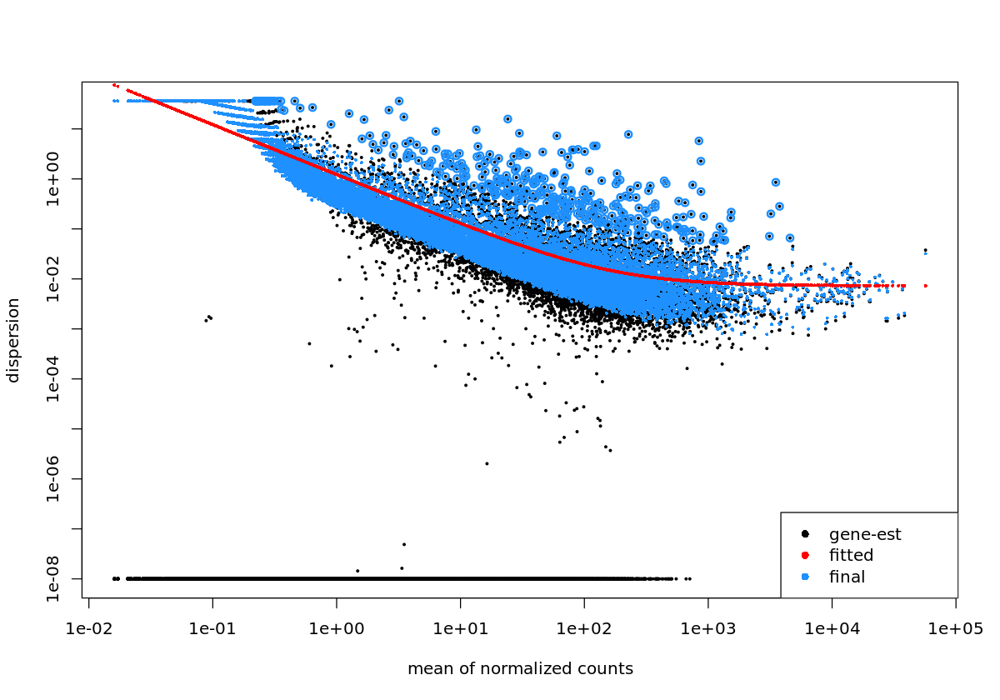

In [15]:
# WALD:
##############################################
res <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    # reduced.vars=c('Phase'),
    interactions =T,
    test = 'Wald',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)


# LTR:
##############################################
# -Phase
res.lrt <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = T,
    reduced.vars=c('Phase'), # maybe add condition.id, condition:condition.id cannot be removed
    test = 'LRT',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)

#### ~condition + Phase + condition:condition.id

Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 4/36 (11.11%)

+ 7/36 (19.44%)

+ 11/36 (30.56%)

+ 14/36 (38.89%)

+ 18/36 (50%)

+ 22/36 (61.11%)

+ 25/36 (69.44%)

+ 29/36 (80.56%)

+ 32/36 (88.89%)

+ 36/36 (100%)

Merging 36 objects

Restoring factors



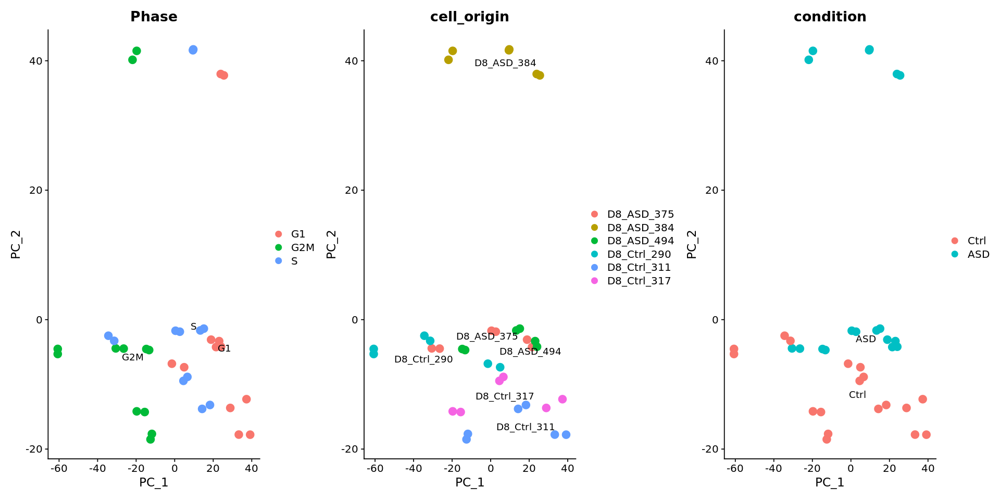

~condition + Phase + condition:condition.id



[1] "../results/markers_pseudobulk/2_472//Wald...condition..Phase..condition-condition.id/"


Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk/2_472//Wald...condition..Phase..condition-condition.id' already exists”
Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA



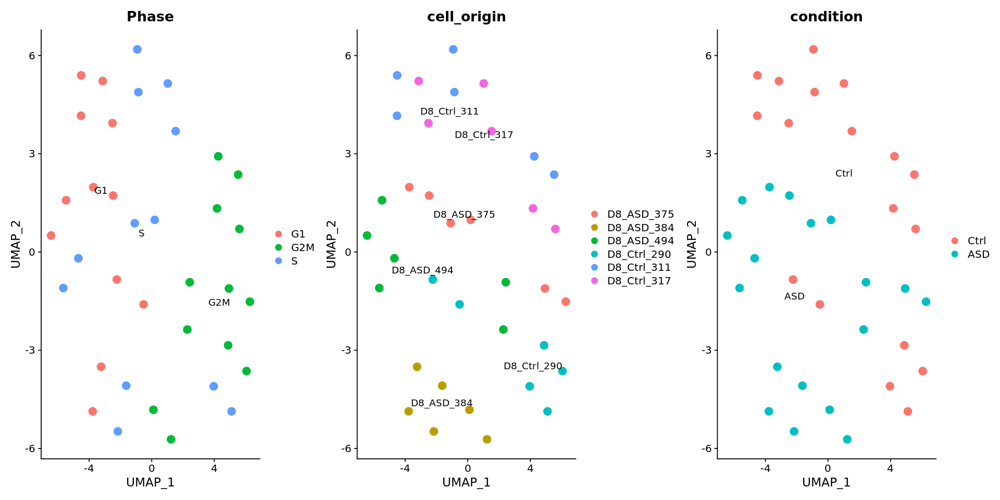

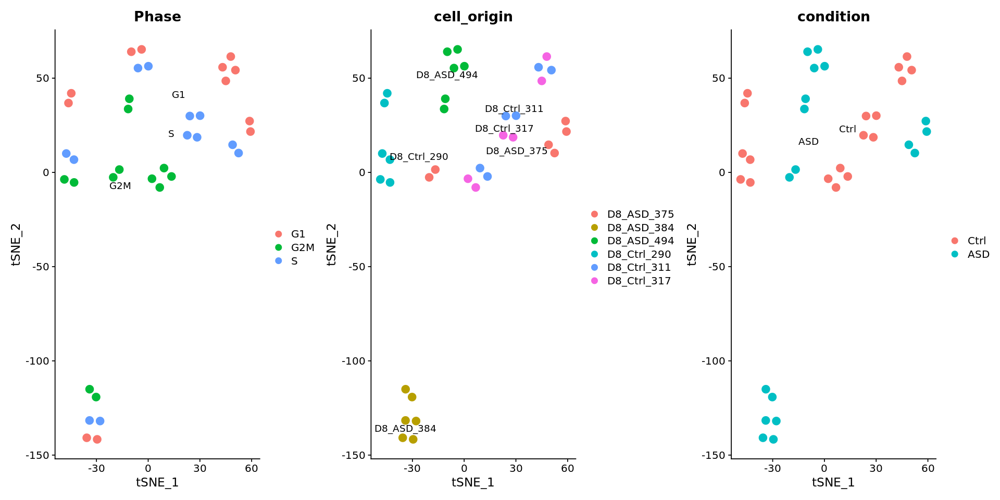

Sample correlation plot



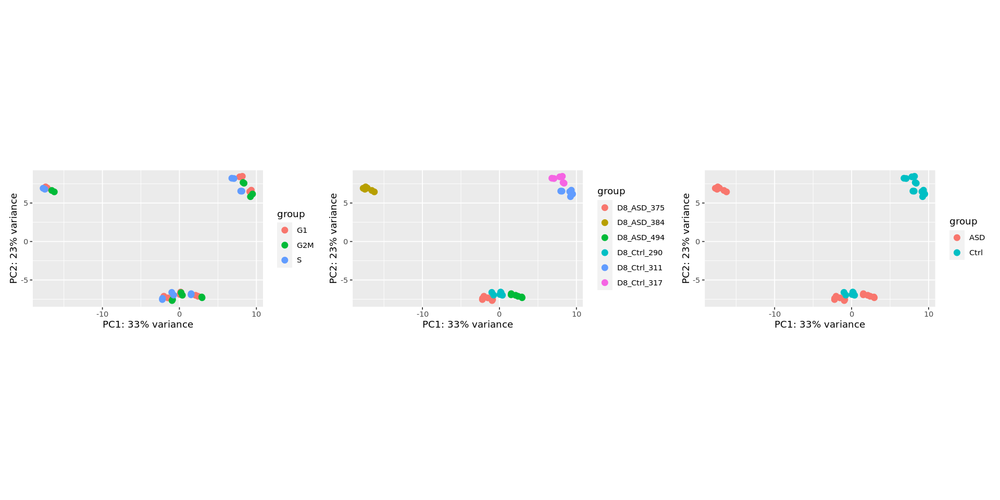

Dispersion estimates plot



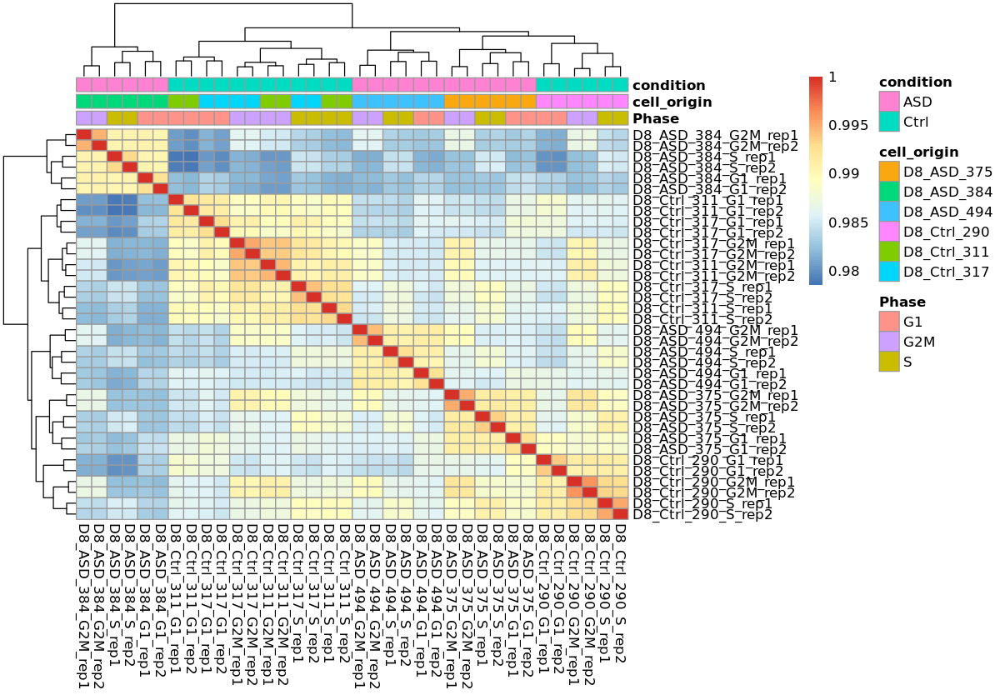

Gathering results



padj_cutoff = 0.05
+ TRUE 3342 & FALSE 13019
log2fc_cutoff = 0.58
+ Over-expressed genes: 538
+ Under-expressed genes: 446


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3109 & FALSE 12218
log2fc_cutoff = 0.58
+ Over-expressed genes: 358
+ Under-expressed genes: 235


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 4016 & FALSE 11828
log2fc_cutoff = 0.58
+ Over-expressed genes: 556
+ Under-expressed genes: 264


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 2913 & FALSE 14481
log2fc_cutoff = 0.58
+ Over-expressed genes: 467
+ Under-expressed genes: 580


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 4711 & FALSE 12683
log2fc_cutoff = 0.58
+ Over-expressed genes: 1095
+ Under-expressed genes: 734


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 4105 & FALSE 12773
log2fc_cutoff = 0.58
+ Over-expressed genes: 620
+ Under-expressed genes: 741


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 4531 & FALSE 11313
log2fc_cutoff = 0.58
+ Over-expressed genes: 740
+ Under-expressed genes: 555


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 4/36 (11.11%)

+ 7/36 (19.44%)

+ 11/36 (30.56%)

+ 14/36 (38.89%)

+ 18/36 (50%)

+ 22/36 (61.11%)

+ 25/36 (69.44%)

+ 29/36 (80.56%)

+ 32/36 (88.89%)

+ 36/36 (100%)

Merging 36 objects

Restoring factors

~condition + Phase + condition:condition.id

~Phase



[1] "../results/markers_pseudobulk/2_472//LRT...condition..Phase..condition-condition.id...Phase/"


Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk/2_472//LRT...condition..Phase..condition-condition.id...Phase' already exists”
Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA

Sample correlation plot

Dispersion estimates plot

Gathering results



padj_cutoff = 0.05
+ TRUE 9102 & FALSE 9879
log2fc_cutoff = 0.58
+ Over-expressed genes: 851
+ Under-expressed genes: 700


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9102 & FALSE 9879
log2fc_cutoff = 0.58
+ Over-expressed genes: 292
+ Under-expressed genes: 280


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9102 & FALSE 9879
log2fc_cutoff = 0.58
+ Over-expressed genes: 460
+ Under-expressed genes: 217


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9102 & FALSE 9879
log2fc_cutoff = 0.58
+ Over-expressed genes: 714
+ Under-expressed genes: 897


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9102 & FALSE 9879
log2fc_cutoff = 0.58
+ Over-expressed genes: 1340
+ Under-expressed genes: 905


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9102 & FALSE 9879
log2fc_cutoff = 0.58
+ Over-expressed genes: 822
+ Under-expressed genes: 1036


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9102 & FALSE 9879
log2fc_cutoff = 0.58
+ Over-expressed genes: 1061
+ Under-expressed genes: 782


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


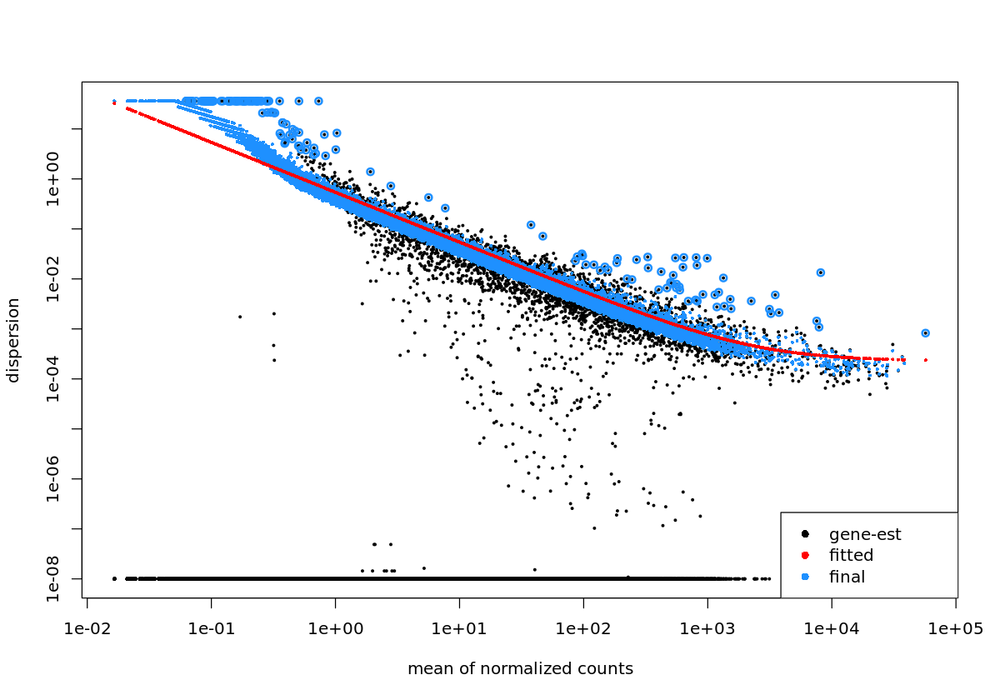

In [16]:
# WALD:
##############################################
res <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = list(c('condition', 'condition.id')),
    # reduced.vars=c('Phase'),
    # interactions =F,
    test = 'Wald',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)

# LTR:
##############################################
# -Phase
res.lrt <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = list(c('condition', 'condition.id')),
    reduced.vars=c('Phase'), # maybe add condition.id, condition:condition.id cannot be removed
    test = 'LRT',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)

## N samples & fixed cells

In [17]:
n_samples <- 4
n_cells <- floor(min(table(seu.rge@meta.data[,c('Phase', 'cell_origin')]))/n_samples)

save.dir <- file.path(results.dir, glue::glue('{n_samples}_{n_cells}/'))
dir.create(save.dir)
save.dir

Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk//4_236' already exists”


[1] "../results/markers_pseudobulk//4_236/"

#### ~condition + Phase

Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 7/72 (9.72%)

+ 14/72 (19.44%)

+ 22/72 (30.56%)

+ 29/72 (40.28%)

+ 36/72 (50%)

+ 43/72 (59.72%)

+ 50/72 (69.44%)

+ 58/72 (80.56%)

+ 65/72 (90.28%)

+ 72/72 (100%)

Merging 72 objects

Restoring factors



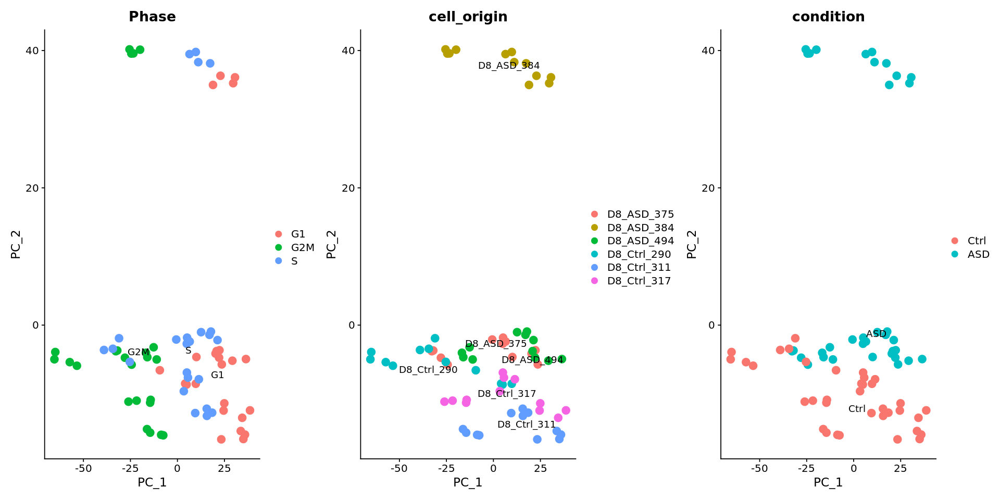

~condition + Phase



[1] "../results/markers_pseudobulk//4_236//Wald...condition..Phase/"


Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk//4_236//Wald...condition..Phase' already exists”
Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA



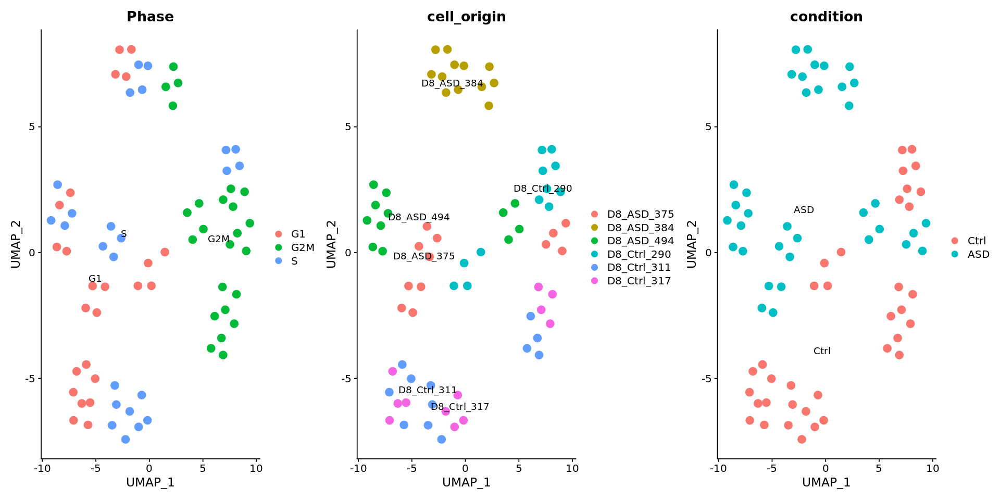

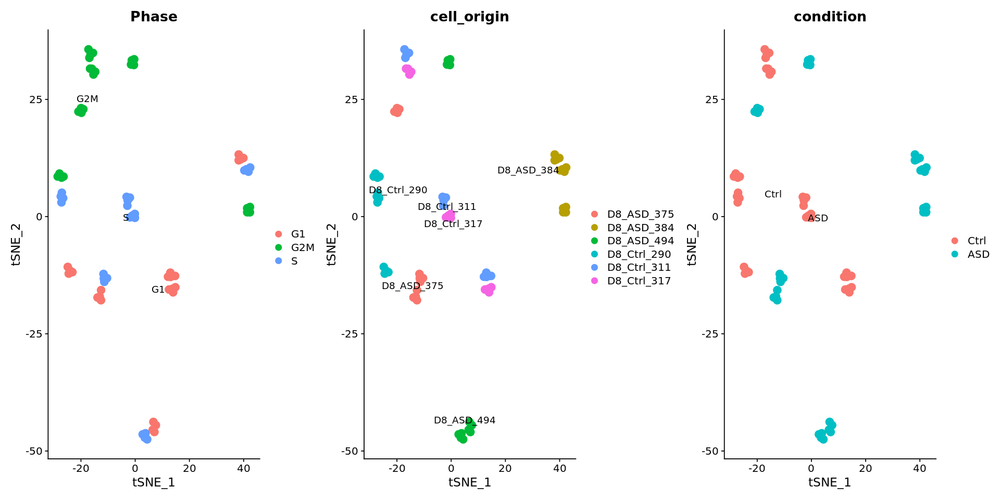

Sample correlation plot



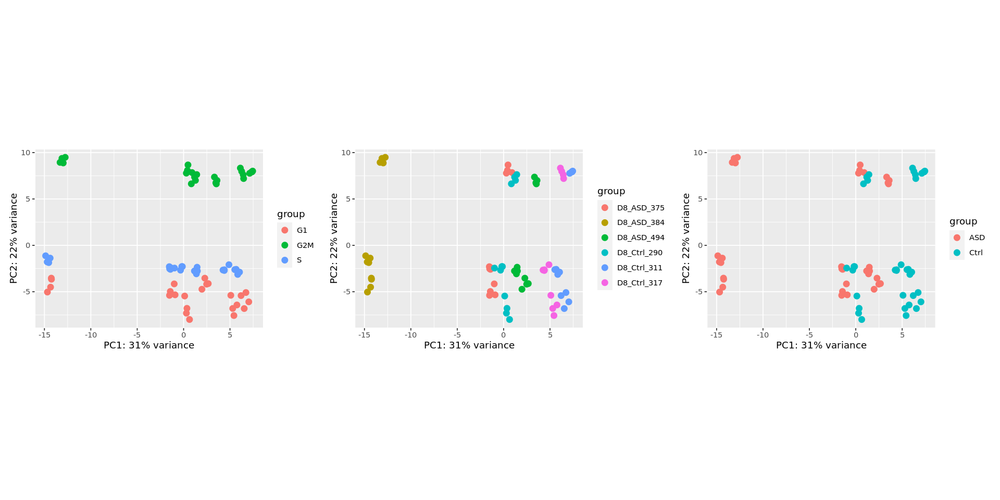

Dispersion estimates plot



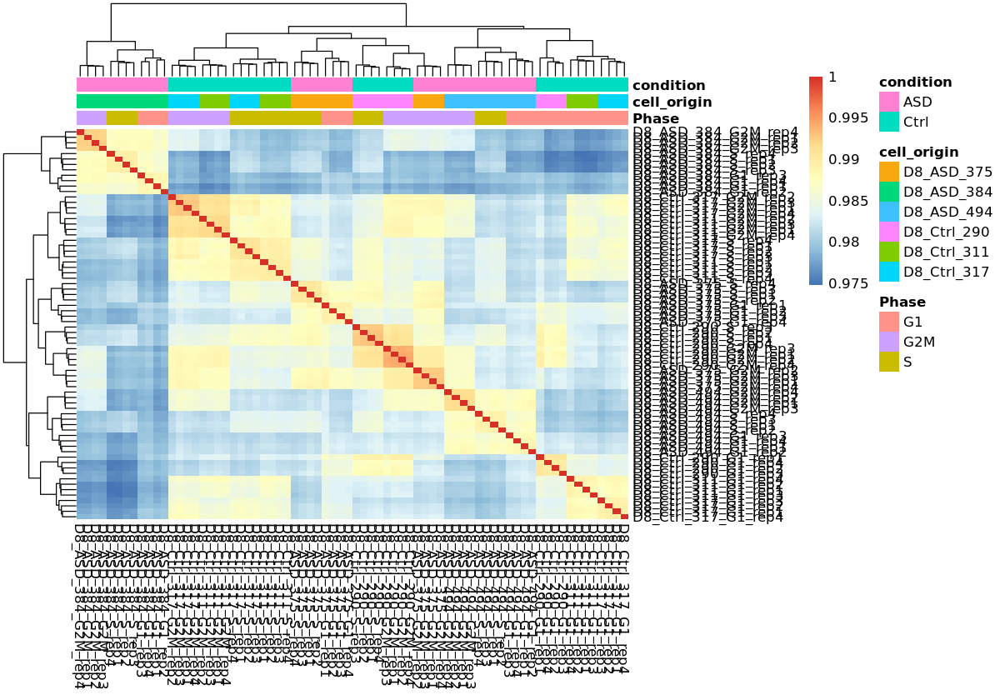

Gathering results



padj_cutoff = 0.05
+ TRUE 5249 & FALSE 12164
log2fc_cutoff = 0.58
+ Over-expressed genes: 886
+ Under-expressed genes: 234


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 2678 & FALSE 12148
log2fc_cutoff = 0.58
+ Over-expressed genes: 360
+ Under-expressed genes: 257


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3462 & FALSE 11881
log2fc_cutoff = 0.58
+ Over-expressed genes: 532
+ Under-expressed genes: 275


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 7/72 (9.72%)

+ 14/72 (19.44%)

+ 22/72 (30.56%)

+ 29/72 (40.28%)

+ 36/72 (50%)

+ 43/72 (59.72%)

+ 50/72 (69.44%)

+ 58/72 (80.56%)

+ 65/72 (90.28%)

+ 72/72 (100%)

Merging 72 objects

Restoring factors

~condition + Phase

~Phase



[1] "../results/markers_pseudobulk//4_236//LRT...condition..Phase...Phase/"


Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk//4_236//LRT...condition..Phase...Phase' already exists”
Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA

Sample correlation plot

Dispersion estimates plot

Gathering results



padj_cutoff = 0.05
+ TRUE 5233 & FALSE 12701
log2fc_cutoff = 0.58
+ Over-expressed genes: 915
+ Under-expressed genes: 260


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 5233 & FALSE 12701
log2fc_cutoff = 0.58
+ Over-expressed genes: 158
+ Under-expressed genes: 158


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 5233 & FALSE 12701
log2fc_cutoff = 0.58
+ Over-expressed genes: 254
+ Under-expressed genes: 124


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


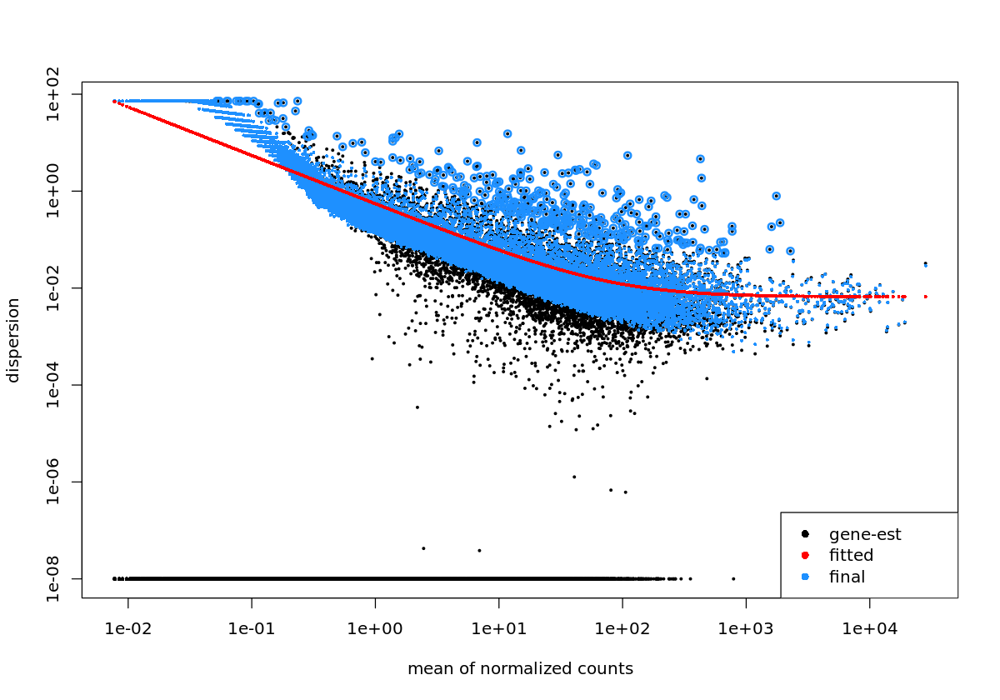

In [18]:
# WALD:
##############################################
res <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    # reduced.vars=c('Phase'),
    interactions =F,
    test = 'Wald',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)


# LTR:
##############################################
# -Phase
res.lrt <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = F,
    reduced.vars=c('Phase'), # maybe add condition.id, condition:condition.id cannot be removed
    test = 'LRT',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)

#### ~condition + Phase + condition:phase

Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 7/72 (9.72%)

+ 14/72 (19.44%)

+ 22/72 (30.56%)

+ 29/72 (40.28%)

+ 36/72 (50%)

+ 43/72 (59.72%)

+ 50/72 (69.44%)

+ 58/72 (80.56%)

+ 65/72 (90.28%)

+ 72/72 (100%)

Merging 72 objects

Restoring factors



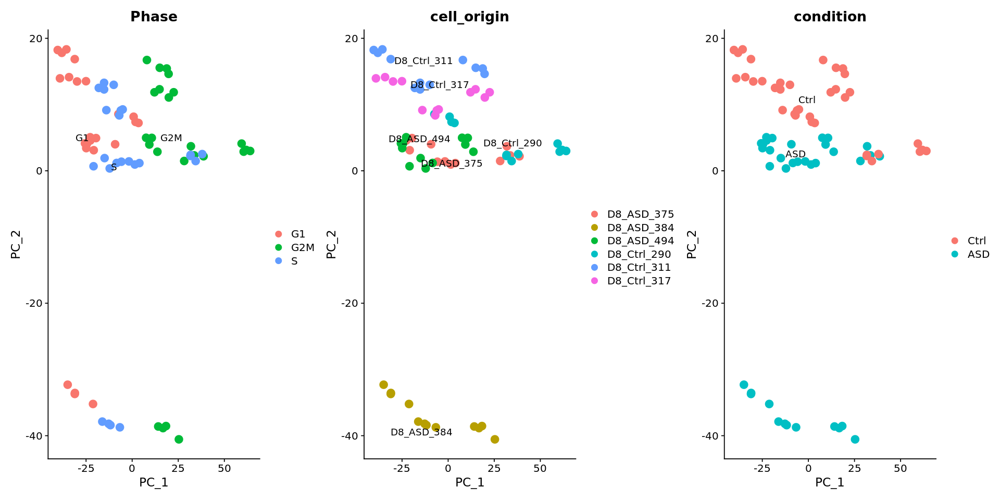

~condition + Phase + condition:Phase



[1] "../results/markers_pseudobulk//4_236//Wald...condition..Phase..condition-Phase/"


Warning message in dir.create(save.dir):
“'../results/markers_pseudobulk//4_236//Wald...condition..Phase..condition-Phase' already exists”
Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA



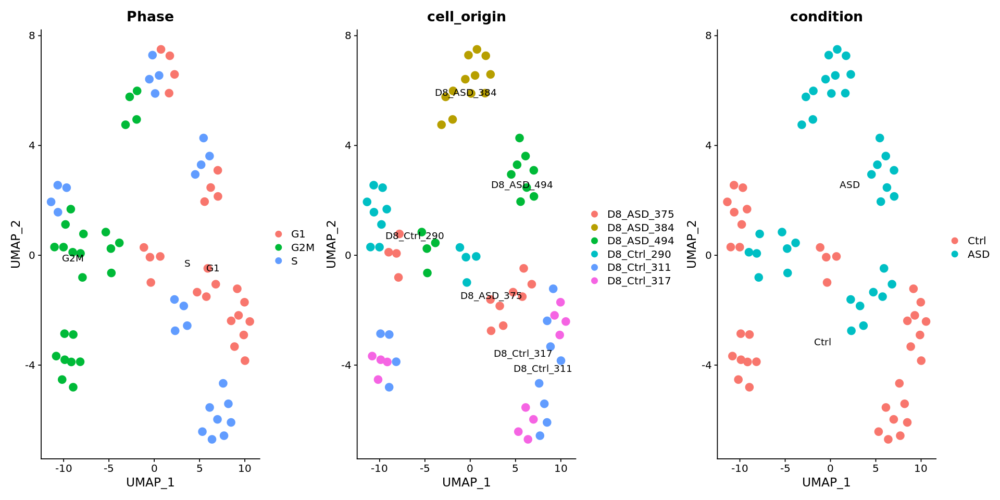

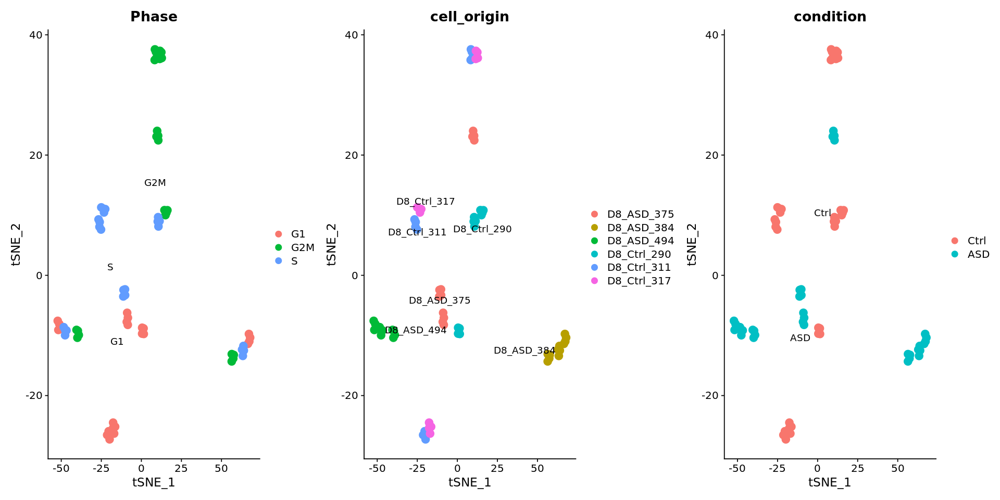

Sample correlation plot



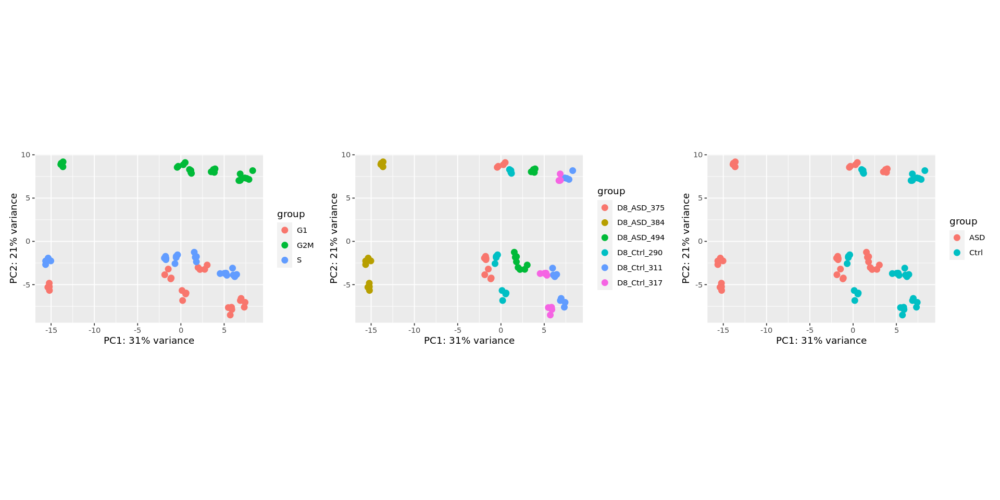

Dispersion estimates plot



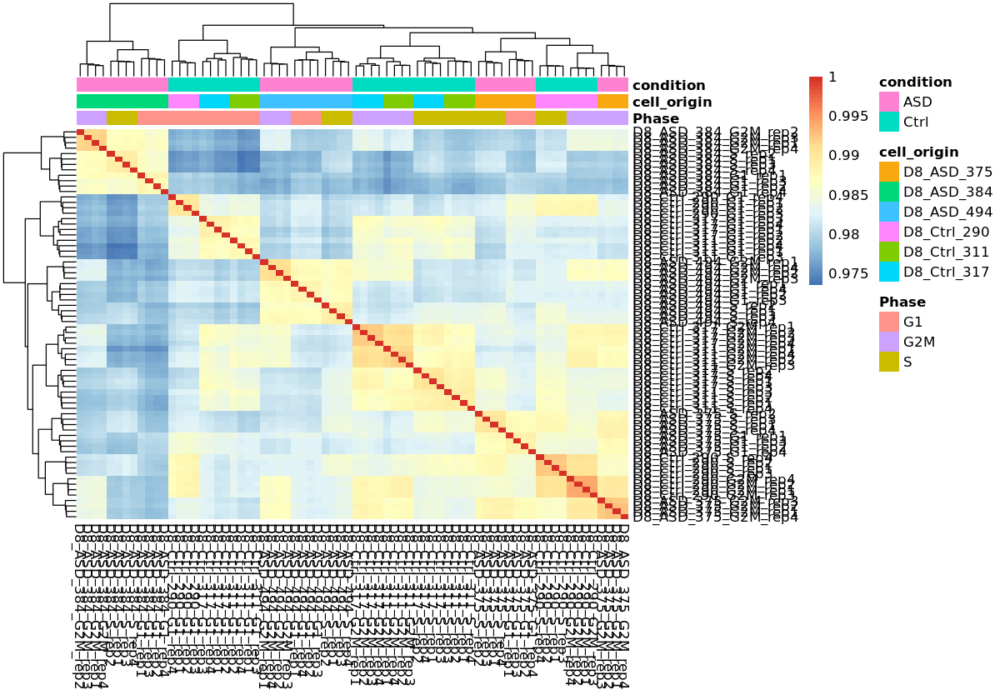

Gathering results



padj_cutoff = 0.05
+ TRUE 2038 & FALSE 12797
log2fc_cutoff = 0.58
+ Over-expressed genes: 475
+ Under-expressed genes: 134


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 1659 & FALSE 12140
log2fc_cutoff = 0.58
+ Over-expressed genes: 390
+ Under-expressed genes: 176


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 2146 & FALSE 12171
log2fc_cutoff = 0.58
+ Over-expressed genes: 539
+ Under-expressed genes: 188


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 60 & FALSE 8560
log2fc_cutoff = 0.58
+ Over-expressed genes: 0
+ Under-expressed genes: 32
padj_cutoff = 0.05
+ TRUE 40 & FALSE 8580
log2fc_cutoff = 0.58
+ Over-expressed genes: 0
+ Under-expressed genes: 27


Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 7/72 (9.72%)

+ 14/72 (19.44%)

+ 22/72 (30.56%)

+ 29/72 (40.28%)

+ 36/72 (50%)

+ 43/72 (59.72%)

+ 50/72 (69.44%)

+ 58/72 (80.56%)

+ 65/72 (90.28%)

+ 72/72 (100%)

Merging 72 objects

Restoring factors

~condition + Phase + condition:Phase

~Phase



[1] "../results/markers_pseudobulk//4_236//LRT...condition..Phase..condition-Phase...Phase/"


Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA

Sample correlation plot

Dispersion estimates plot

Gathering results



padj_cutoff = 0.05
+ TRUE 3848 & FALSE 13018
log2fc_cutoff = 0.58
+ Over-expressed genes: 770
+ Under-expressed genes: 197


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3848 & FALSE 13018
log2fc_cutoff = 0.58
+ Over-expressed genes: 264
+ Under-expressed genes: 147


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3848 & FALSE 13018
log2fc_cutoff = 0.58
+ Over-expressed genes: 344
+ Under-expressed genes: 121


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3848 & FALSE 13018
log2fc_cutoff = 0.58
+ Over-expressed genes: 107
+ Under-expressed genes: 189


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3848 & FALSE 13018
log2fc_cutoff = 0.58
+ Over-expressed genes: 104
+ Under-expressed genes: 185


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


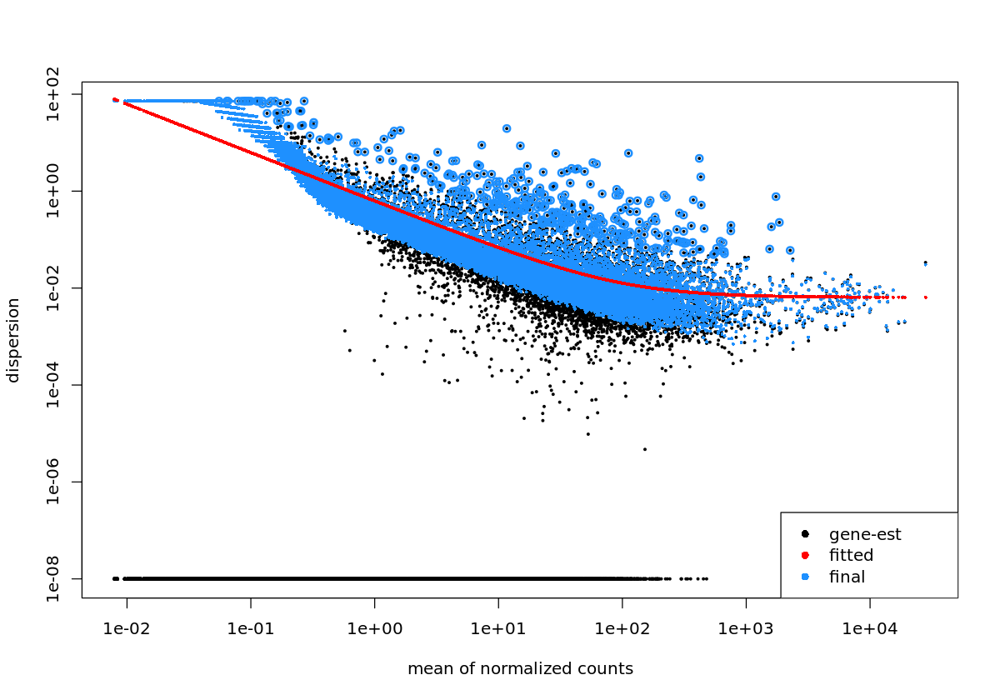

In [19]:
# WALD:
##############################################
res <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    # reduced.vars=c('Phase'),
    interactions =T,
    test = 'Wald',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)


# LTR:
##############################################
# -Phase
res.lrt <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = T,
    reduced.vars=c('Phase'), # maybe add condition.id, condition:condition.id cannot be removed
    test = 'LRT',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)

#### ~condition + Phase + condition:condition.id

Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 7/72 (9.72%)

+ 14/72 (19.44%)

+ 22/72 (30.56%)

+ 29/72 (40.28%)

+ 36/72 (50%)

+ 43/72 (59.72%)

+ 50/72 (69.44%)

+ 58/72 (80.56%)

+ 65/72 (90.28%)

+ 72/72 (100%)

Merging 72 objects

Restoring factors



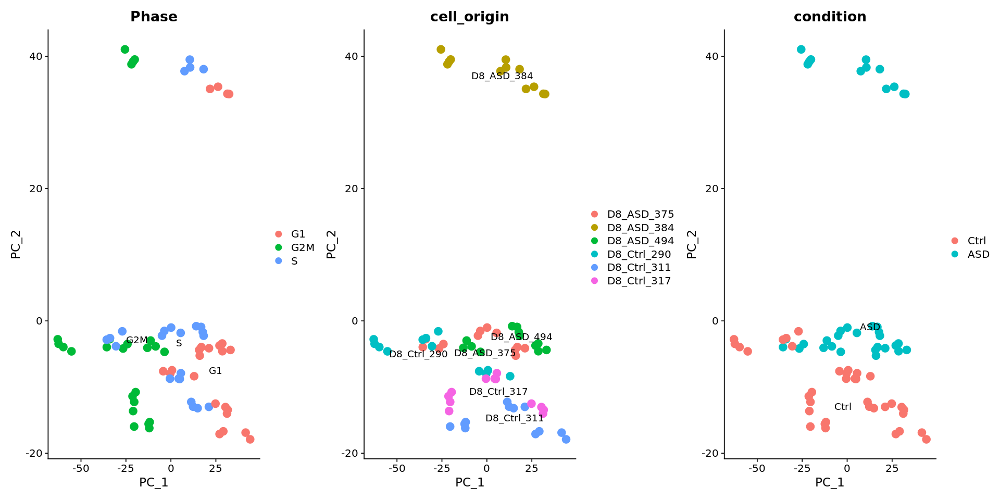

~condition + Phase + condition:condition.id



[1] "../results/markers_pseudobulk//4_236//Wald...condition..Phase..condition-condition.id/"


Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA



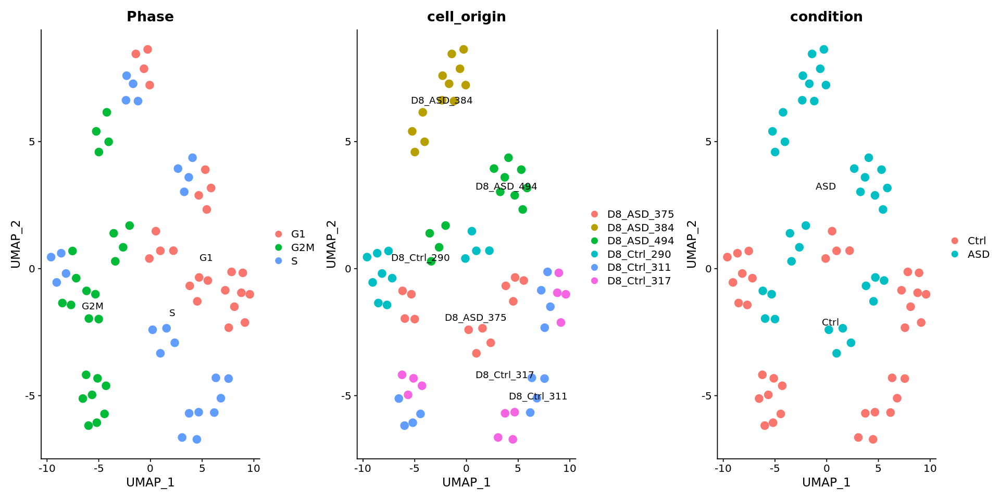

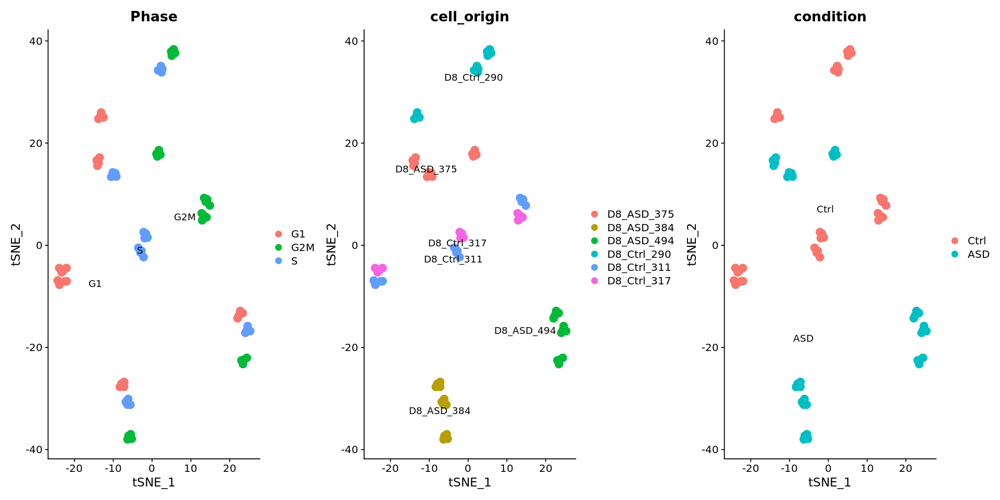

Sample correlation plot



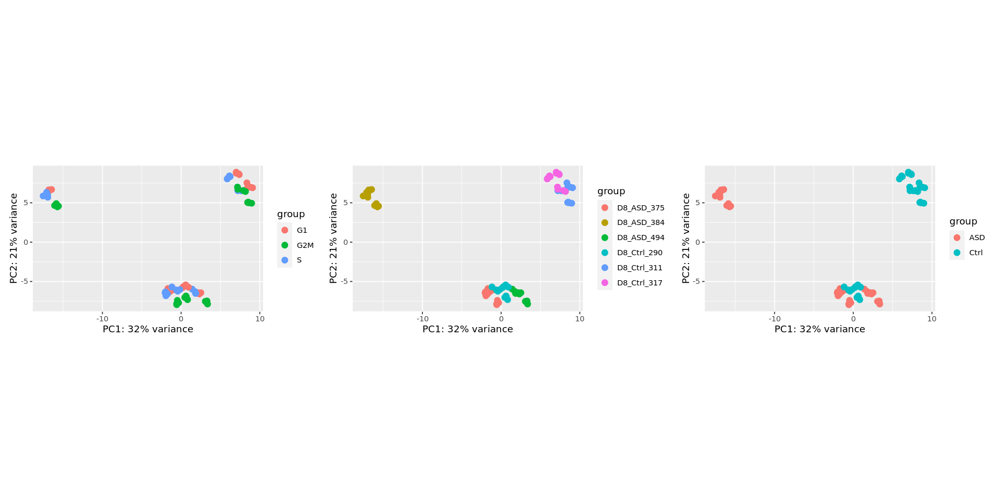

Dispersion estimates plot



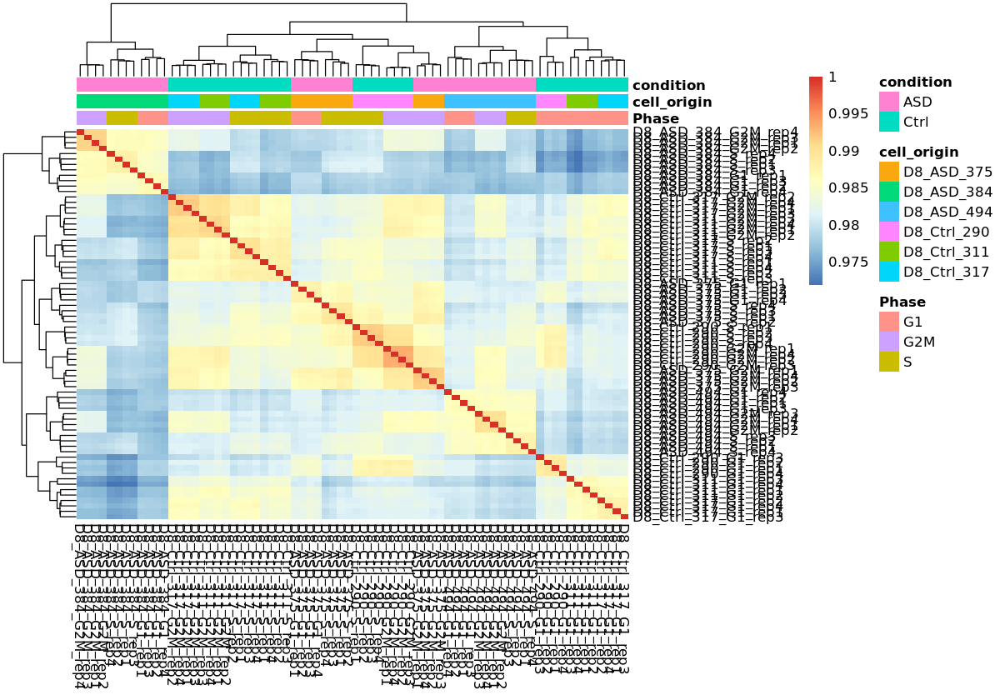

Gathering results



padj_cutoff = 0.05
+ TRUE 3928 & FALSE 12984
log2fc_cutoff = 0.58
+ Over-expressed genes: 642
+ Under-expressed genes: 492


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3635 & FALSE 12241
log2fc_cutoff = 0.58
+ Over-expressed genes: 362
+ Under-expressed genes: 325


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 4508 & FALSE 10850
log2fc_cutoff = 0.58
+ Over-expressed genes: 570
+ Under-expressed genes: 316


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3476 & FALSE 13436
log2fc_cutoff = 0.58
+ Over-expressed genes: 535
+ Under-expressed genes: 615


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 5320 & FALSE 12110
log2fc_cutoff = 0.58
+ Over-expressed genes: 1227
+ Under-expressed genes: 776


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 4765 & FALSE 12665
log2fc_cutoff = 0.58
+ Over-expressed genes: 724
+ Under-expressed genes: 792


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 4935 & FALSE 12495
log2fc_cutoff = 0.58
+ Over-expressed genes: 838
+ Under-expressed genes: 579


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 7/72 (9.72%)

+ 14/72 (19.44%)

+ 22/72 (30.56%)

+ 29/72 (40.28%)

+ 36/72 (50%)

+ 43/72 (59.72%)

+ 50/72 (69.44%)

+ 58/72 (80.56%)

+ 65/72 (90.28%)

+ 72/72 (100%)

Merging 72 objects

Restoring factors

~condition + Phase + condition:condition.id

~Phase



[1] "../results/markers_pseudobulk//4_236//LRT...condition..Phase..condition-condition.id...Phase/"


Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA

Sample correlation plot

Dispersion estimates plot

Gathering results



padj_cutoff = 0.05
+ TRUE 10065 & FALSE 8352
log2fc_cutoff = 0.58
+ Over-expressed genes: 932
+ Under-expressed genes: 721


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 10065 & FALSE 8352
log2fc_cutoff = 0.58
+ Over-expressed genes: 328
+ Under-expressed genes: 357


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 10065 & FALSE 8352
log2fc_cutoff = 0.58
+ Over-expressed genes: 488
+ Under-expressed genes: 236


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 10065 & FALSE 8352
log2fc_cutoff = 0.58
+ Over-expressed genes: 781
+ Under-expressed genes: 918


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 10065 & FALSE 8352
log2fc_cutoff = 0.58
+ Over-expressed genes: 1466
+ Under-expressed genes: 979


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 10065 & FALSE 8352
log2fc_cutoff = 0.58
+ Over-expressed genes: 938
+ Under-expressed genes: 1053


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 10065 & FALSE 8352
log2fc_cutoff = 0.58
+ Over-expressed genes: 1141
+ Under-expressed genes: 798


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


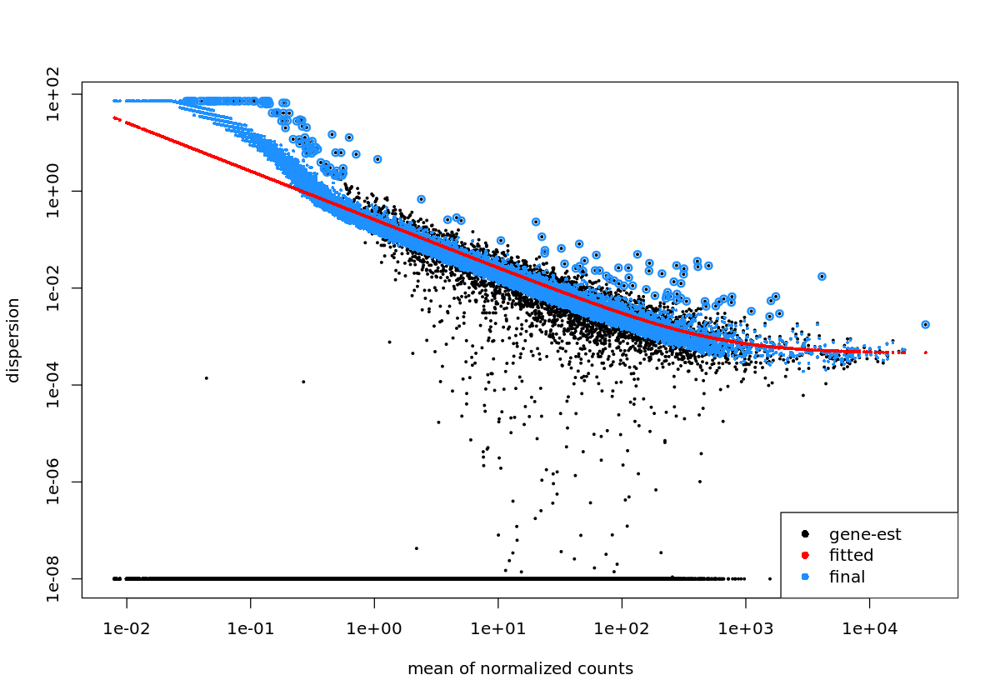

In [20]:
# WALD:
##############################################
res <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = list(c('condition', 'condition.id')),
    # reduced.vars=c('Phase'),
    # interactions =F,
    test = 'Wald',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)

# LTR:
##############################################
# -Phase
res.lrt <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = list(c('condition', 'condition.id')),
    reduced.vars=c('Phase'), # maybe add condition.id, condition:condition.id cannot be removed
    test = 'LRT',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = n_samples, cells.per.sample = n_cells, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    verbose=T, show=T, save.dir=save.dir)

## Only one sample per group and all cells

In [21]:
n_samples <- 1
n_cells <- NULL

save.dir <- file.path(results.dir, glue::glue('{n_samples}_NULL/'))
dir.create(save.dir)

In [22]:
save.dir <- file.path(results.dir, 'one_sample/')
dir.create(save.dir)

#### ~condition + Phase + condition:condition.id

Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 2/18 (11.11%)

+ 4/18 (22.22%)

+ 5/18 (27.78%)

+ 7/18 (38.89%)

+ 9/18 (50%)

+ 11/18 (61.11%)

+ 13/18 (72.22%)

+ 14/18 (77.78%)

+ 16/18 (88.89%)

+ 18/18 (100%)

Merging 18 objects

Restoring factors



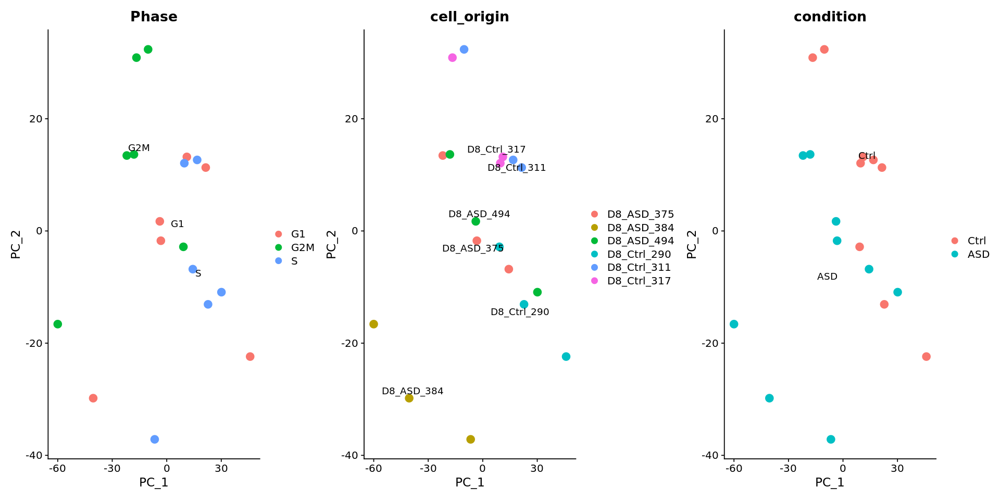

~condition + Phase + condition:condition.id



[1] "../results/markers_pseudobulk//one_sample//Wald...condition..Phase..condition-condition.id/"


Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA



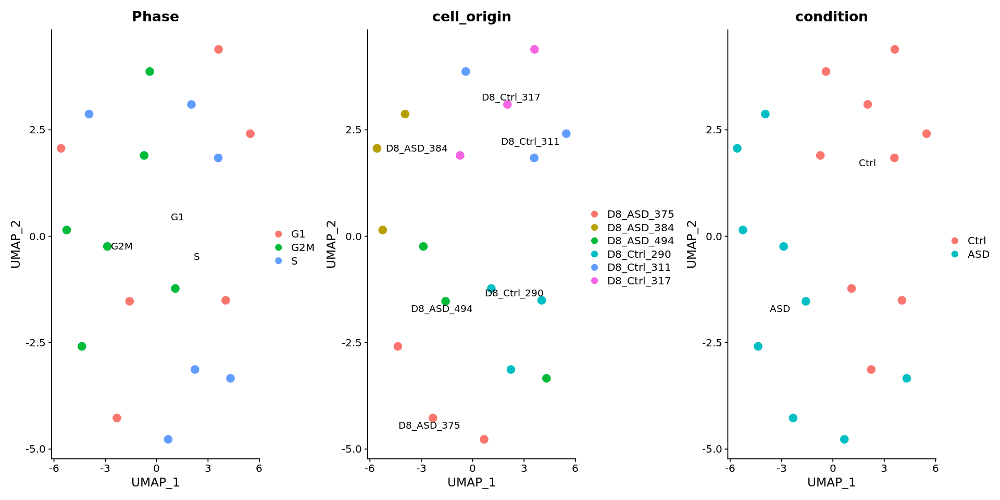

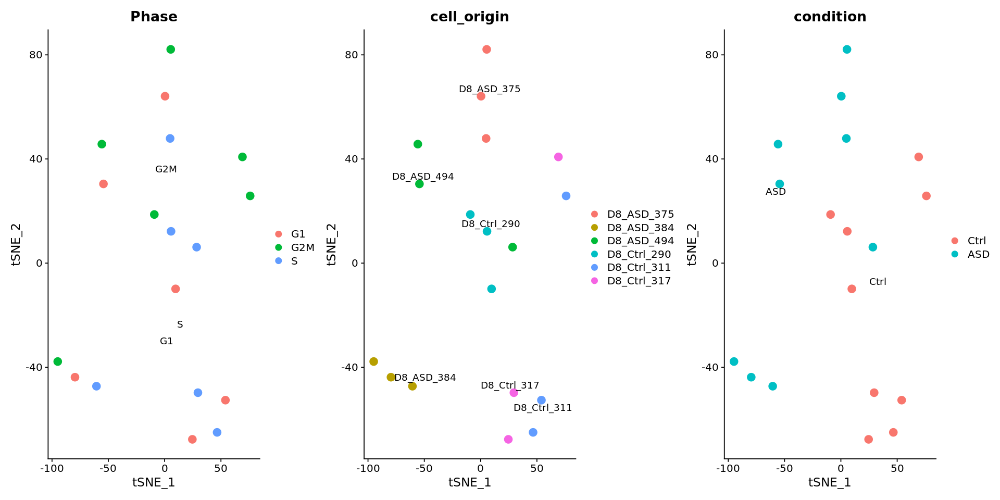

Sample correlation plot



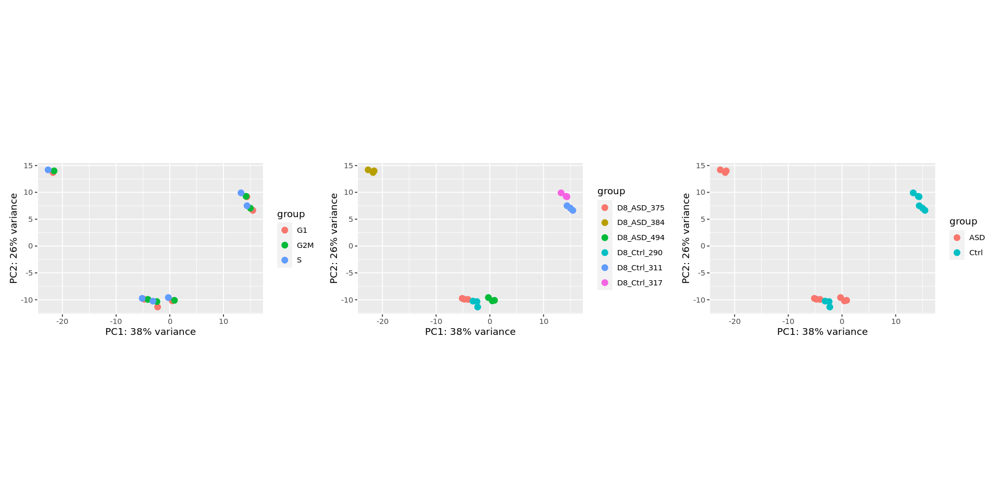

Dispersion estimates plot



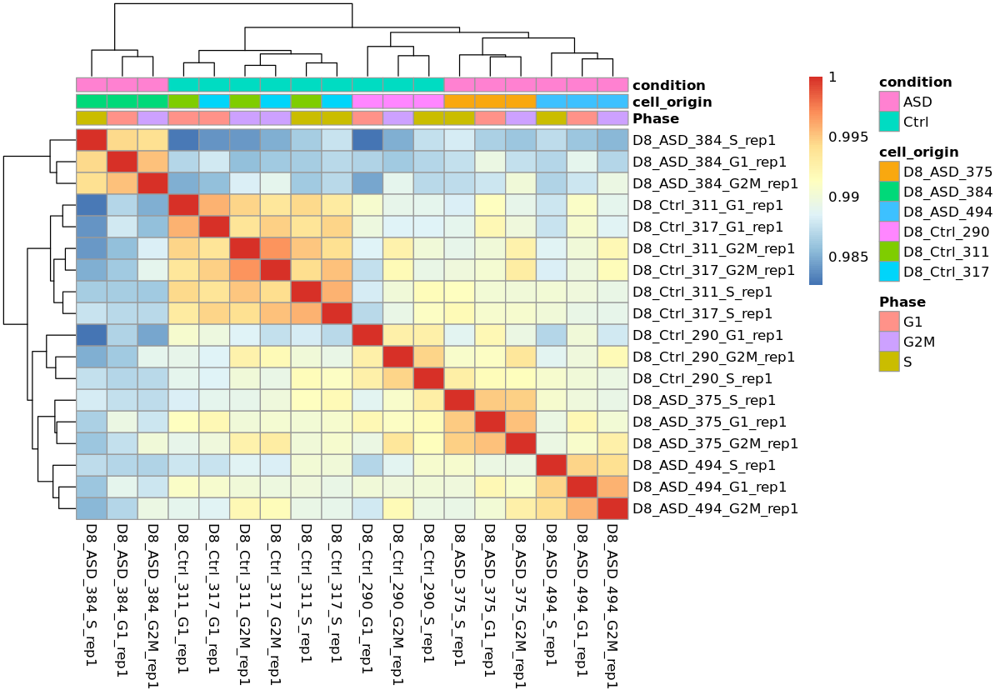

Gathering results



padj_cutoff = 0.05
+ TRUE 3504 & FALSE 13103
log2fc_cutoff = 0.58
+ Over-expressed genes: 563
+ Under-expressed genes: 482


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3549 & FALSE 12513
log2fc_cutoff = 0.58
+ Over-expressed genes: 365
+ Under-expressed genes: 229


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 4485 & FALSE 10487
log2fc_cutoff = 0.58
+ Over-expressed genes: 564
+ Under-expressed genes: 245
padj_cutoff = 0.05
+ TRUE 3102 & FALSE 14596
log2fc_cutoff = 0.58
+ Over-expressed genes: 461
+ Under-expressed genes: 637


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 5546 & FALSE 13242
log2fc_cutoff = 0.58
+ Over-expressed genes: 1205
+ Under-expressed genes: 846


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 4304 & FALSE 12849
log2fc_cutoff = 0.58
+ Over-expressed genes: 615
+ Under-expressed genes: 810


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 5264 & FALSE 12434
log2fc_cutoff = 0.58
+ Over-expressed genes: 793
+ Under-expressed genes: 646


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 2/18 (11.11%)

+ 4/18 (22.22%)

+ 5/18 (27.78%)

+ 7/18 (38.89%)

+ 9/18 (50%)

+ 11/18 (61.11%)

+ 13/18 (72.22%)

+ 14/18 (77.78%)

+ 16/18 (88.89%)

+ 18/18 (100%)

Merging 18 objects

Restoring factors

~condition + Phase + condition:condition.id

~Phase



[1] "../results/markers_pseudobulk//one_sample//LRT...condition..Phase..condition-condition.id...Phase/"


Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA

Sample correlation plot

Dispersion estimates plot

Gathering results



padj_cutoff = 0.05
+ TRUE 9918 & FALSE 10506
log2fc_cutoff = 0.58
+ Over-expressed genes: 886
+ Under-expressed genes: 791


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9918 & FALSE 10506
log2fc_cutoff = 0.58
+ Over-expressed genes: 293
+ Under-expressed genes: 261


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9918 & FALSE 10506
log2fc_cutoff = 0.58
+ Over-expressed genes: 472
+ Under-expressed genes: 201


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9918 & FALSE 10506
log2fc_cutoff = 0.58
+ Over-expressed genes: 734
+ Under-expressed genes: 1003


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9918 & FALSE 10506
log2fc_cutoff = 0.58
+ Over-expressed genes: 1436
+ Under-expressed genes: 1003


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9918 & FALSE 10506
log2fc_cutoff = 0.58
+ Over-expressed genes: 853
+ Under-expressed genes: 1148


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 9918 & FALSE 10506
log2fc_cutoff = 0.58
+ Over-expressed genes: 1073
+ Under-expressed genes: 870


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


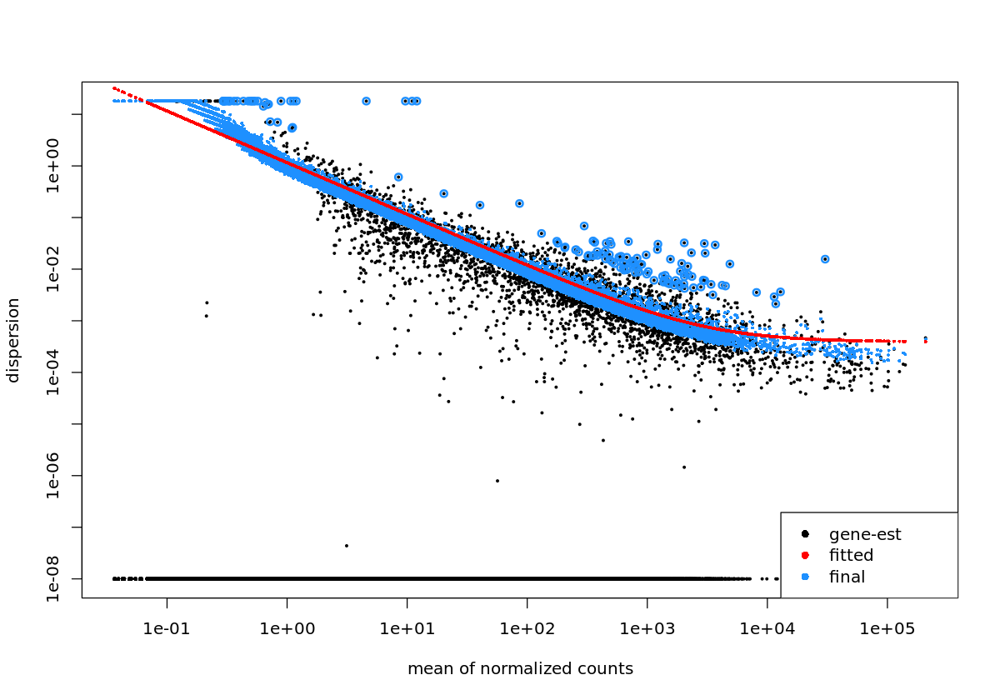

In [23]:
# WALD:
##############################################
res.1 <- pseudobulk_dea( 
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = list(c('condition', 'condition.id')),
    # reduced.vars=c('Phase'),
    # interactions =F,
    test = 'Wald',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = 1, cells.per.sample = NULL, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    save.dir = save.dir, verbose=T, show=T)

# LTR:
##############################################
# -Phase
res.1.lrt <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = list(c('condition', 'condition.id')),
    reduced.vars=c('Phase'), # maybe add condition.id, condition:condition.id cannot be USED
    test = 'LRT',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = 1, cells.per.sample = NULL, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    save.dir = save.dir, verbose=T, show=T)


#### ~condition + Phase 

Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 2/18 (11.11%)

+ 4/18 (22.22%)

+ 5/18 (27.78%)

+ 7/18 (38.89%)

+ 9/18 (50%)

+ 11/18 (61.11%)

+ 13/18 (72.22%)

+ 14/18 (77.78%)

+ 16/18 (88.89%)

+ 18/18 (100%)

Merging 18 objects

Restoring factors



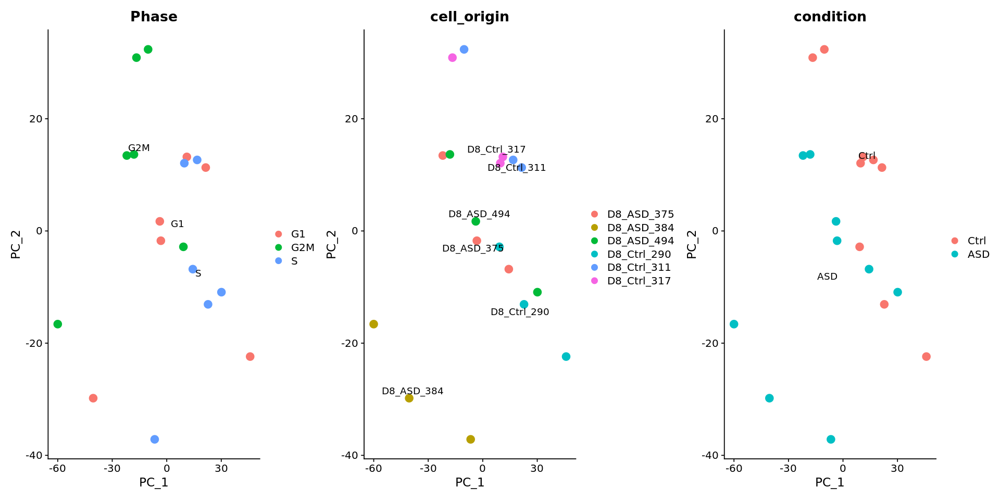

~condition + Phase



[1] "../results/markers_pseudobulk//one_sample//Wald...condition..Phase/"


Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA



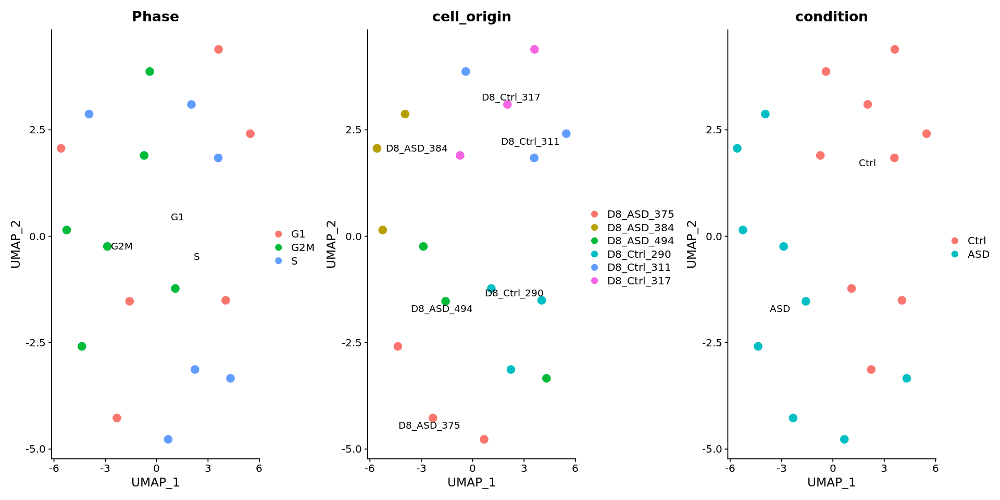

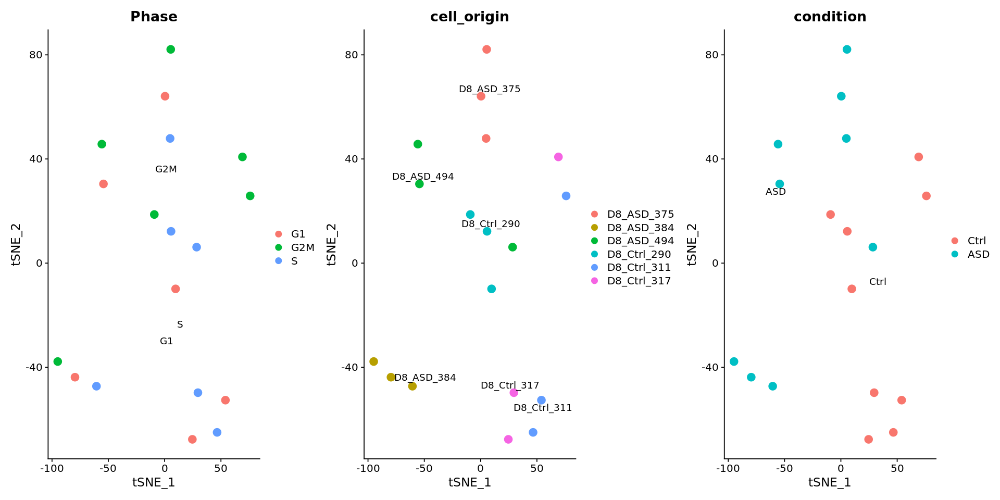

Sample correlation plot



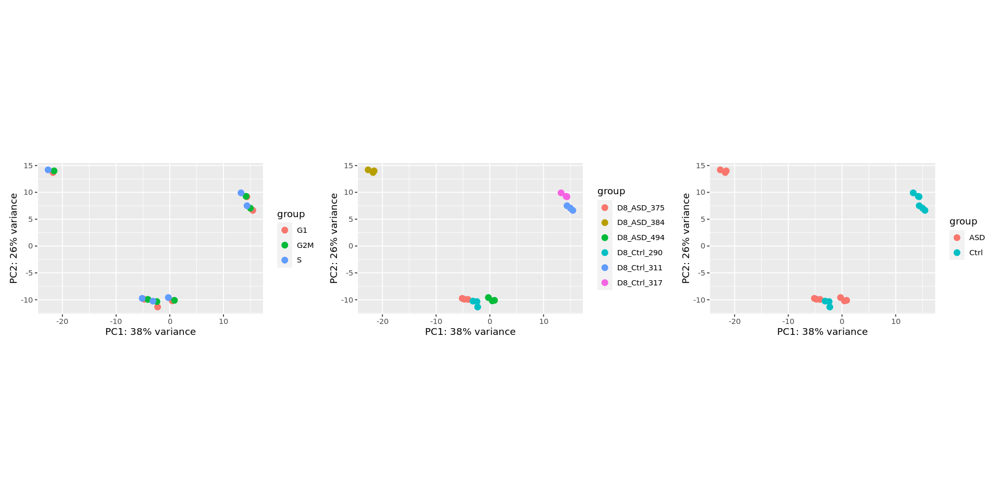

Dispersion estimates plot



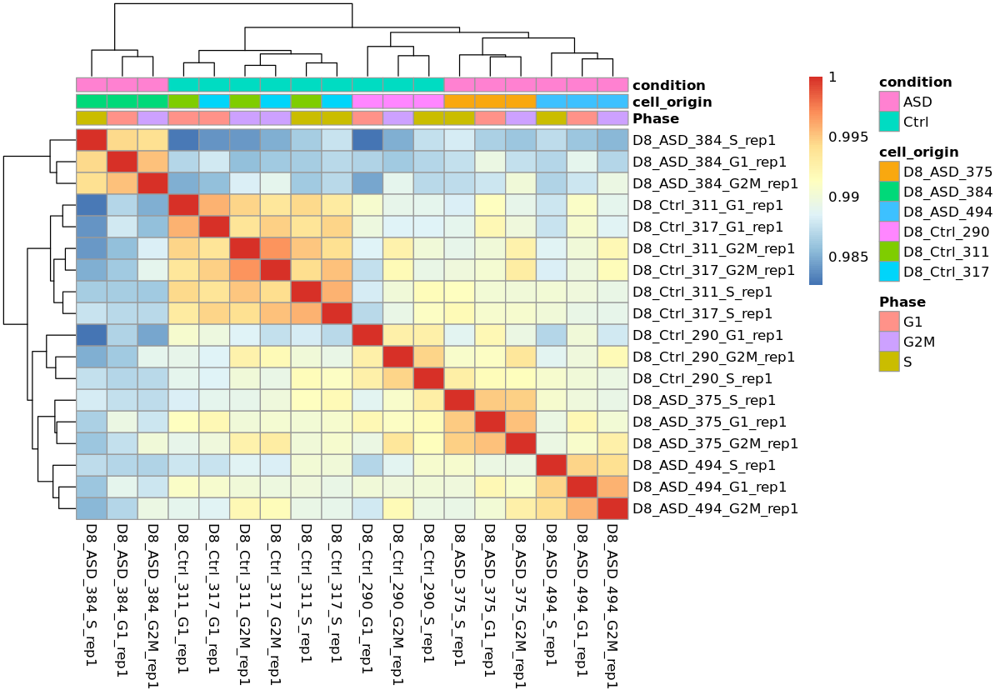

Gathering results



padj_cutoff = 0.05
+ TRUE 3281 & FALSE 13847
log2fc_cutoff = 0.58
+ Over-expressed genes: 613
+ Under-expressed genes: 186


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 1362 & FALSE 13588
log2fc_cutoff = 0.58
+ Over-expressed genes: 333
+ Under-expressed genes: 123
padj_cutoff = 0.05
+ TRUE 1979 & FALSE 13515
log2fc_cutoff = 0.58
+ Over-expressed genes: 467
+ Under-expressed genes: 179


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Grouping cells

Sampling cells recursively

Naming samples

Aggregating expression

+ 2/18 (11.11%)

+ 4/18 (22.22%)

+ 5/18 (27.78%)

+ 7/18 (38.89%)

+ 9/18 (50%)

+ 11/18 (61.11%)

+ 13/18 (72.22%)

+ 14/18 (77.78%)

+ 16/18 (88.89%)

+ 18/18 (100%)

Merging 18 objects

Restoring factors

~condition + Phase

~Phase



[1] "../results/markers_pseudobulk//one_sample//LRT...condition..Phase...Phase/"


Starting test

converting counts to integer mode

using supplied model matrix

estimating size factors

estimating dispersions

gene-wise dispersion estimates: 94 workers

mean-dispersion relationship

final dispersion estimates, fitting model and testing: 94 workers

QC plots

PCA

Sample correlation plot

Dispersion estimates plot

Gathering results



padj_cutoff = 0.05
+ TRUE 3272 & FALSE 13858
log2fc_cutoff = 0.58
+ Over-expressed genes: 609
+ Under-expressed genes: 187


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3272 & FALSE 13858
log2fc_cutoff = 0.58
+ Over-expressed genes: 103
+ Under-expressed genes: 75


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


padj_cutoff = 0.05
+ TRUE 3272 & FALSE 13858
log2fc_cutoff = 0.58
+ Over-expressed genes: 182
+ Under-expressed genes: 71


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”


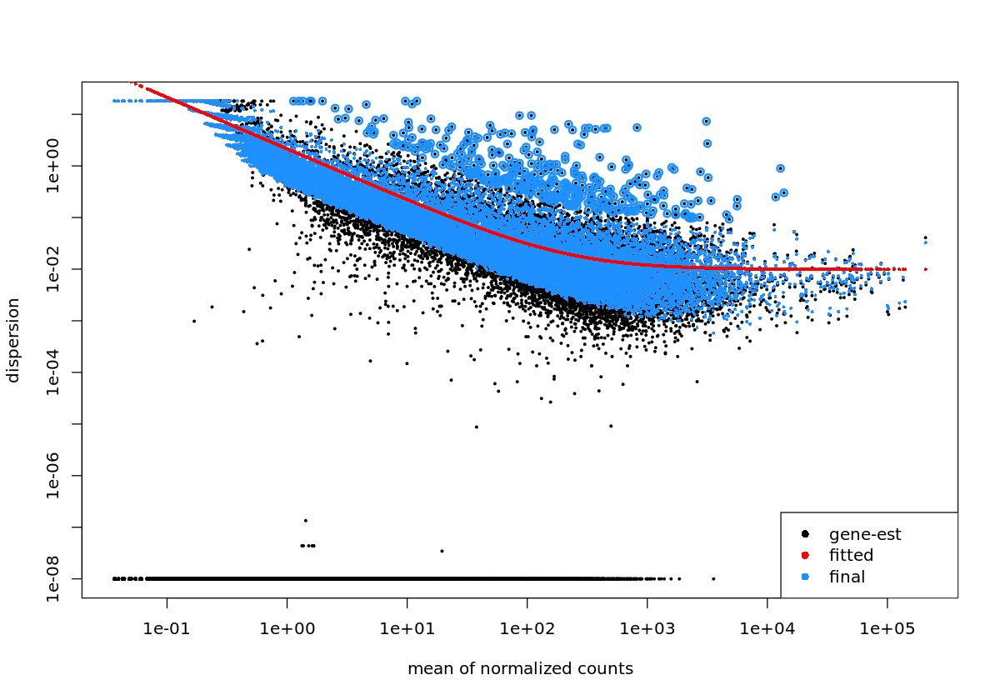

In [24]:
# WALD:
##############################################
res.1 <- pseudobulk_dea( 
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    # reduced.vars=c('Phase'),
    interactions =F,
    test = 'Wald',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = 1, cells.per.sample = NULL, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    save.dir = save.dir, verbose=T, show=T)


# LTR:
##############################################
# -Phase
res.1.lrt <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = F,
    reduced.vars=c('Phase'), # maybe add condition.id, condition:condition.id cannot be USED
    test = 'LRT',
    scale.factor = 10000,
    lognorm = F,
    samples.per.group = 1, cells.per.sample = NULL, sel.method='recursive',
    # sel.method='simspec', simspec.ratio=1/4000,
    save.dir = save.dir, verbose=T, show=T)

#### ~phase + condition:phase + condition:condition.id + condition

In [25]:
## WALD
##############################################
res.simspec <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = 'phase',
    color.vars=c('cell_origin', 'condition', 'phase'),
    
    comp.vars = c('phase', 'condition'),
    # reduced.vars=c('Phase'),
    interactions =list(c('condition', 'Phase'),
                       c('condition', 'condition.id')),
    test = 'Wald',
    scale.factor = 10000,
    lognorm = F,
    # samples.per.group = 1, cells.per.sample = NULL, sel.method='recursive',
    sel.method='simspec', simspec.ratio=simspec_ratio,
    verbose=T, show=T, save.dir=save.dir)


## LTR
##############################################
res.simspec.lrt <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = 'cell_origin',
    color.vars=c('cell_origin', 'condition'),
    
    comp.vars = c('Phase', 'condition'),
    interactions =list(c('condition', 'Phase'),
                       c('condition', 'condition.id')),
    reduced.vars=c('Phase'), # maybe add condition.id, condition:condition.id cannot be removed
    test = 'LRT',
    scale.factor = 10000,
    lognorm = F,
    # samples.per.group = 1, cells.per.sample = NULL, sel.method='recursive',
    sel.method='simspec', simspec.ratio=simspec_ratio,
    verbose=T, show=T, save.dir=save.dir)

Grouping cells



ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'f' in selecting a method for function 'split': undefined columns selected


## simspec

In [ ]:
simspec_ratio <- 1/300

save.dir <- file.path(results.dir, glue::glue('simspec_{round(simspec_ratio, 2)}/'))
dir.create(save.dir)

#### ~condition + Phase + condition:condition.id

In [ ]:
# WALD:
##############################################
res.simspec <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = list(c('condition', 'condition.id')),
    # reduced.vars=c('Phase'),
    # interactions =F,
    test = 'Wald',
    scale.factor = 10000,
    lognorm = F,
    # samples.per.group = 4, cells.per.sample = 200, sel.method='recursive',
    sel.method='simspec', simspec.ratio=simspec_ratio,
    verbose=T, show=T, save.dir=save.dir)


# LTR:
##############################################
# -Phase
res.simspec.lrt <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = list(c('condition', 'condition.id')),
    reduced.vars=c('Phase'), # maybe add condition.id, condition:condition.id cannot be removed
    test = 'LRT',
    scale.factor = 10000,
    lognorm = F,
    # samples.per.group = 4, cells.per.sample = 200, sel.method='recursive',
    sel.method='simspec', simspec.ratio=simspec_ratio,
    verbose=T, show=T, save.dir=save.dir)

#### ~condition + Phase 

In [ ]:
# WALD:
##############################################
res.simspec <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    # reduced.vars=c('Phase'),
    interactions =F,
    test = 'Wald',
    scale.factor = 10000,
    lognorm = F,
    # samples.per.group = 4, cells.per.sample = 200, sel.method='recursive',
    sel.method='simspec', simspec.ratio=simspec_ratio,
    verbose=T, show=T, save.dir=save.dir)

# LTR:
##############################################
# -Phase
res.simspec.lrt <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = c('Phase'),
    color.vars=c('Phase', 'cell_origin', 'condition'),
    
    comp.vars = c('condition' , 'Phase'),
    interactions = F,
    reduced.vars=c('Phase'), # maybe add condition.id, condition:condition.id cannot be removed
    test = 'LRT',
    scale.factor = 10000,
    lognorm = F,
    # samples.per.group = 4, cells.per.sample = 200, sel.method='recursive',
    sel.method='simspec', simspec.ratio=simspec_ratio,
    verbose=T, show=T, save.dir=save.dir)

#### ~phase + condition:phase + condition:condition.id + condition

In [ ]:
## WALD
##############################################
res.simspec <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = 'phase',
    color.vars=c('cell_origin', 'condition', 'phase'),
    
    comp.vars = c('phase', 'condition'),
    # reduced.vars=c('Phase'),
    interactions =list(c('condition', 'Phase'),
                       c('condition', 'condition.id')),
    test = 'Wald',
    scale.factor = 10000,
    lognorm = F,
    # samples.per.group = 4, cells.per.sample = 200, sel.method='recursive',
    sel.method='simspec', simspec.ratio=simspec_ratio,
    verbose=T, show=T, save.dir=save.dir)


## LTR
##############################################
res.simspec.lrt <- pseudobulk_dea(
    seu.rge,
    cluster.var = c('cell_origin'), 
    group.vars = 'cell_origin',
    color.vars=c('cell_origin', 'condition'),
    
    comp.vars = c('Phase', 'condition'),
    interactions =list(c('condition', 'Phase'),
                       c('condition', 'condition.id')),
    reduced.vars=c('Phase'), # maybe add condition.id, condition:condition.id cannot be removed
    test = 'LRT',
    scale.factor = 10000,
    lognorm = F,
    # samples.per.group = 4, cells.per.sample = 200, sel.method='recursive',
    sel.method='simspec', simspec.ratio=simspec_ratio,
    verbose=T, show=T, save.dir=save.dir)